In [1]:
import arviz as az
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import pystan
import seaborn as sns
import scipy as sp

#### Import stan convergence utilities from local directory 
Utilities originally by Betancourt, [see this notebook on Bayesian workflow](http://mc-stan.org/users/documentation/case-studies/pystan_workflow.html).

In [2]:
%run utility/stan_utility.py

#### Import data

In [3]:
names = ['streams', 'acousticness', 'danceability', 'energy', 'loudness', 'tempo', 'valence']
global_data  = pd.read_csv('./data/global_selected.csv',header=None, names=names)
finland_data = pd.read_csv('./data/finland_selected.csv',header=None, names=names)
sweden_data  = pd.read_csv('./data/sweden_selected.csv',header=None, names=names)

global_data_2018 = pd.read_csv('./data/2018_global.csv')
finland_data_2018 = pd.read_csv('./data/2018_finland.csv')
sweden_data_2018 = pd.read_csv('./data/2018_sweden.csv')

#### Methods for saving and loading models

In [4]:
def save_model(model, filename):
    """Saves the compiled model to file."""
    with open(filename, 'wb') as file:
        pickle.dump(model, file)

def load_model(filename):
    """Load already compiled model from file."""
    return pickle.load(open(filename, 'rb'))

# __Bayesian Inference on Spotify Streams__ | Models
## __Introduction__
This notebook contains the modeling for our `Bayesian Data Analysis`-course project.
#### This notebook is structured in a following way:
1. __Introducing bayesian linear regression model__
2. __Modeling and inference__ 
    1. 3-covariate model with uninformative priors
    2. 3-covariate model with normal priors
    3. 5-covariate model with normal priors
    4. Extended 5-covariate model with interaction terms
    5. Extended 5-covariate model with interaction terms and hierarchical prior
3. __Model comparison__
4. __Conclusions__

## __1. Introducing Bayesian Linear Regression Model__
#### __Motivation__ 
We are interested in finding out which features in the spotify's song data determine the number of streams in Spotify. We will study this hypothesis by using multiple linear models which model the linear relationship between the variable that includes data about the number of streams with other variables which we use as predictors.

#### __Assumptions__
We first assume that the relationship between $d$-dimension predictor variables $X = \{X_1,X_2,...,X_d\}$ each having $n$ elements, and observations $Y = \{y_1,y_2,...,y_n\}$ (streams) is modeled by *linear dependence*. We also assume that all elements $y \in Y$ and $x \in X$ are independent of each other. 

The mean $\mu$ of model is described by: $\mu = \mathbb{E}[y_i \mid \beta, X] = \alpha + \beta_1 X_1 + \beta_2 X_2 + , ... , + \beta_d X_d$, where $\alpha$ is the intercept and $\beta = \{\beta_1, \beta_2, ... , \beta_d\}$ the parameter vector for coefficients.

We also need to consider the unknown error term $\sigma$. Thus in general form our model is of the form:  

$$\large Y \sim N(\alpha + \beta_1 X_1 + \beta_2 X_2 + ... + \beta_d X_d, \;\sigma)$$

In bayesian context we are not interested about point-estimate, but rather the whole posterior distribution which takes the form:

$$\large p(\beta \mid y, X) = \frac{p(y \mid \beta,X)p(\beta\mid X)}{p(y\mid X)}$$

#### __Scaling streaming data__
For easier interpretability we will scale streams to interval $[0,1]$ which means that any $y$ is measured in proportion to the highest performing song.

In [5]:
stream_global_max = np.max(global_data['streams'])
for data in [global_data, finland_data, sweden_data]:
    data['streams'] = data['streams'].values / stream_global_max

## __2. Modeling and Inference__

In this notebook each model will go through following stages:     
  * Picking suitable priors
  * Convergence diagnostics
  * Sensitivity analysis
  * Predictive distribution checking
  * Model evaluation

## __2.1 Uninformative model__ | Three predictors with uninformative priors
For the first model we select only three of the predictor variables based on 1) feature importance based on random forest (pre-processing-notebook) 2) collinearity (EDA-notebook) -- because of the assumptions of the linear model, we want to avoid highly collinear pairs such as `loudness ~ energy` and `valence` which is potentially collinear with many other covariates. Following predictors for this models are `danceability, acousticness` and `tempo`. 

Complete model takes the form:

$$ \large Y \sim N(\alpha + \beta_1 X_1 + \beta_2 X_2 + \beta_3 X_3, \;\sigma)$$


We start the modeling with uninformative priors. This type of simple model gives us a crude picture of what the bayesian inference can tell us about the data, and it gives us a reference model which we can then compare the more complex models on.  
Here we let Stan take care of the priors, and it chooses __*uniform priors by default*__. This is also known as the *ordinary linear regression*:

### __Load model__

In [7]:
filename = 'lin_3_uninformative.stan'
with open(filename) as file:
    print(file.read())

data{
    // year 2017 top 100 songs
    int N;        // number of data points
    vector[N] y;  // streams
    vector[N] X1; // acousticness
    vector[N] X2; // danceability
    vector[N] X3; // tempo
    
    // year 2018 top 100 songs
    int Npred;        
    vector[Npred] X1pred; 
    vector[Npred] X2pred;
    vector[Npred] X3pred; 
}

parameters{
    real a;
    vector[3] b;
    real<lower=0> sigma;
}

transformed parameters{
    vector[N] mu;
    mu = a + b[1]*X1 + b[2]*X2 + b[3]*X3;
}

model{
    y ~ normal(mu, sigma);
}

generated quantities{
    vector[Npred] ypred;
    vector[N] log_lik;
    
    for (j in 1:N){ 
        // logarithmic likelihood for streams (PSIS-LOO)
        log_lik[j] = normal_lpdf(y[j] | mu, sigma);
    }
    
    for (j in 1:Npred){
        // prediction for year 2018
        ypred[j] = normal_rng(a + b[1]*X1pred[j] + b[2]*X2pred[j] + b[3]*X3pred[j], sigma);
    } 
 
}


In [10]:
gb_2017 = global_data.values
gb_2018 = global_data.values 
data = dict(N=gb_2017.shape[0],y=gb_2017[:,0],X1=gb_2017[:,1], X2=gb_2017[:,2], X3=gb_2017[:,5],
            Npred=gb_2018.shape[0], X1pred=gb_2018[:,1], X2pred=gb_2018[:,2], X3pred=gb_2018[:,5])

### __Fit model__

In [11]:
# Load compiled model if available
fit = None
try:
  fit = load_model('lin_3_uninformative.stan.saved')
except Exception: 
  fit = pystan.stan(file=filename, data=data, seed=42)
  save_model(fit, filename + '.saved')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_292039ab535cf44cf201c28c58f22d90 NOW.
/home/zenist/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.
  after removing the cwd from sys.path.


In [12]:
samples = fit.extract(permuted=True)

### __Simulation results__ | Posterior

In [13]:
summary = fit.summary(pars = ['a','b','sigma','ypred',]) 
fit_sum = pd.DataFrame(summary['summary'],
                  index=summary['summary_rownames'],
                  columns = summary['summary_colnames'])

fit_sum.iloc[0:10,0:10]

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
a,0.270837,0.000177,0.012441,0.246649,0.262619,0.270714,0.279328,0.295191,4961.735343,0.999447
b[1],0.013580,0.000196,0.012808,-0.011743,0.005000,0.013314,0.022463,0.038011,4282.662540,0.999671
b[2],-0.000398,0.000200,0.013793,-0.028228,-0.009394,-0.000315,0.008882,0.026413,4740.499011,0.999530
b[3],0.008500,0.000204,0.013426,-0.017563,-0.000489,0.008419,0.017451,0.035543,4323.503603,0.999792
sigma,0.122438,0.000150,0.009091,0.105869,0.116092,0.121872,0.128141,0.141802,3652.310655,0.999714
ypred[1],0.299784,0.002134,0.126466,0.046426,0.216266,0.300415,0.383824,0.552790,3513.002720,0.999434
ypred[2],0.289057,0.002102,0.127269,0.044842,0.203381,0.286800,0.372787,0.546291,3666.785908,0.999793
ypred[3],0.290021,0.002040,0.125805,0.042950,0.207094,0.289673,0.373695,0.536456,3802.786751,0.999627
ypred[4],0.258858,0.002072,0.122802,0.016912,0.176592,0.257886,0.342368,0.499728,3512.537290,0.999584
ypred[5],0.251106,0.001949,0.122821,0.016199,0.165497,0.249570,0.332181,0.492026,3970.793253,1.000454


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fce3da7e860>,
      dtype=object)

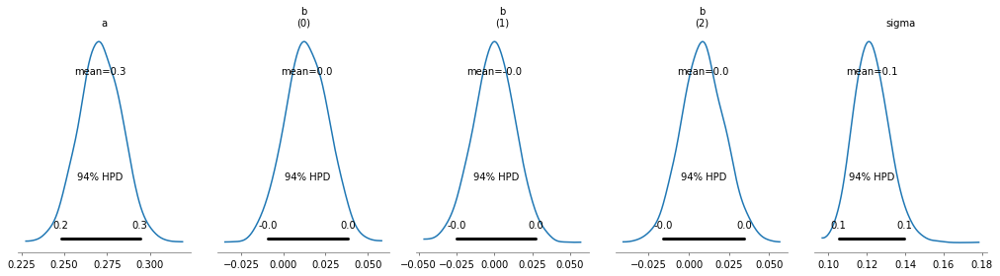

In [14]:
prior_dict = fit.extract(pars=['a','b','sigma'], permuted=False)
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data=['y'], 
                       posterior_predictive=['ypred'], 
                       log_likelihood=fit['log_lik'])

azpos = azfit.posterior.drop(['mu','log_lik'])
az.plot_posterior(azpos, figsize=(14,4))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fce3db55b00>,
      dtype=object)

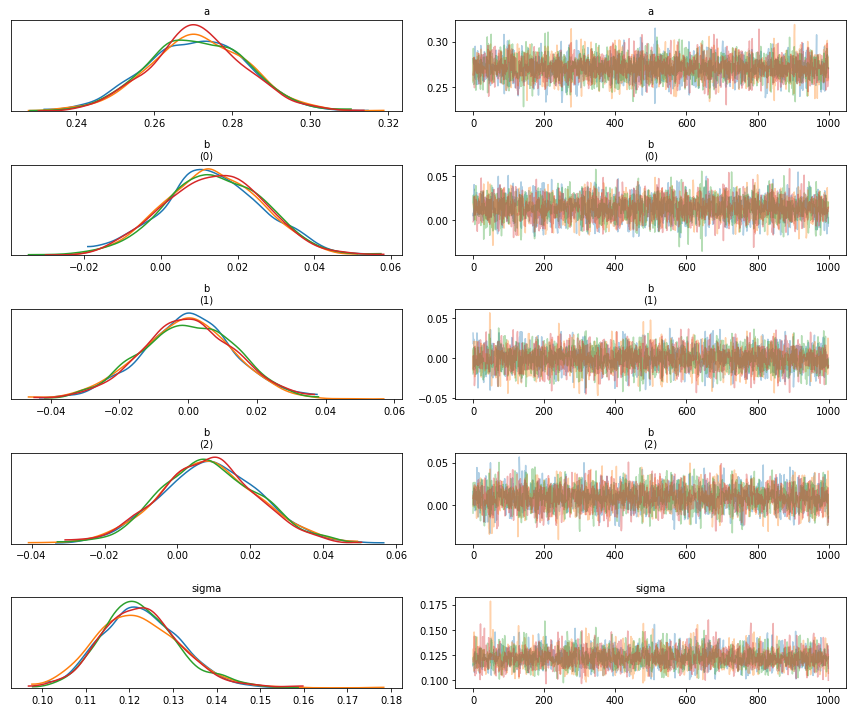

In [15]:
az.plot_trace(azpos)

(<matplotlib.axes._subplots.AxesSubplot at 0x7fce39ec1748>, GridSpec(4, 4))

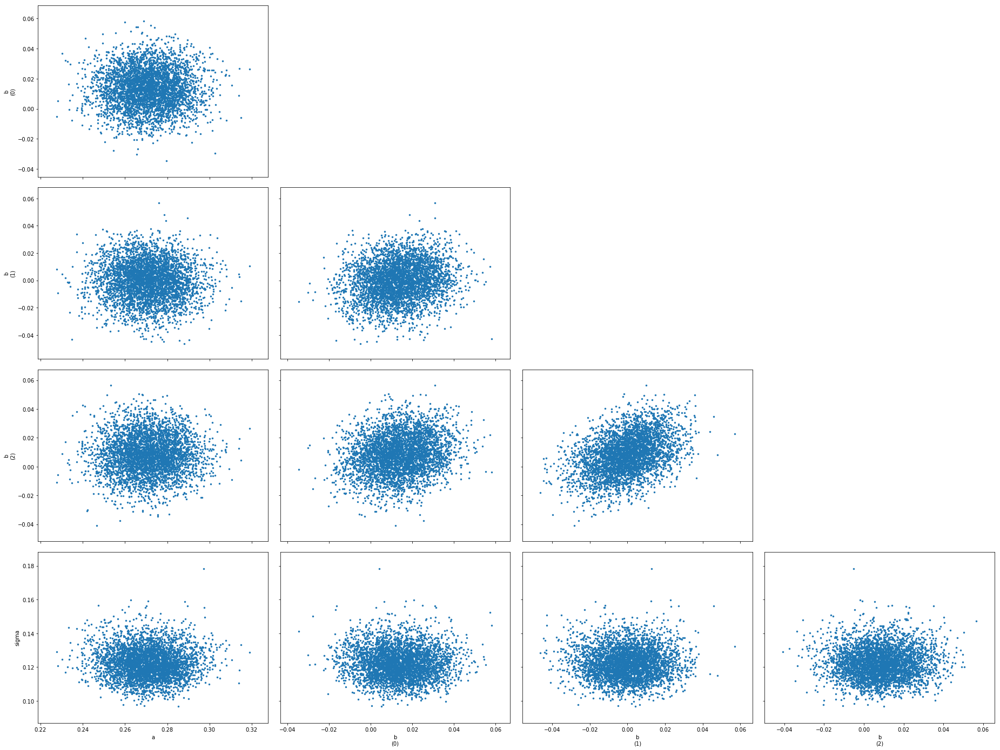

In [16]:
az.plot_pair(azpos)

### __Model check__ | PSIS-LOO

In [17]:
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data='y', 
                       posterior_predictive='ypred', 
                       log_likelihood='log_lik')
az.loo(azfit)

/home/zenist/anaconda3/lib/python3.6/site-packages/mkl_fft/_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:372: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for
        one or more samples. You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal posterior and LOO posterior
        are very different. This is more likely to happen with a non-robust model and highly
        influential observations.
  influential observations."""


,loo,loo_se,p_loo,warning
0,-5407.238592,5546.962048,7236.900066,1


### __Predictive accuracy__ | Predict streams for 2018 top 100 

/home/zenist/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


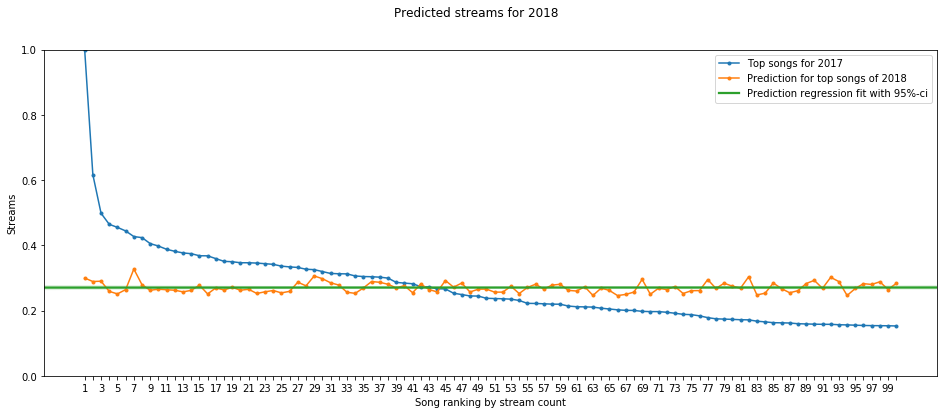

In [18]:
plt.figure(figsize=(16,6))

plt.suptitle('Predicted streams for 2018')
plt.xlabel('Song ranking by stream count')
plt.ylabel('Streams')

plt.ylim(0,1)
plt.xticks(range(1,101),labels=['{0}'.format(i) if i % 2 != 0 else '' for i in range(1,101)])
X_top100 = range(1,101)

plt.plot(X_top100, global_data['streams'], '.-', label='Top songs for 2017')
plt.plot(X_top100, np.mean(samples['ypred'], axis=0),  '.-', label='Prediction for top songs of 2018')
sns.regplot(list(X_top100), list(np.mean(samples['ypred'], axis=0)), 'o-', scatter=False, label='Prediction regression fit with 95%-ci')
plt.legend(loc='best')

## __2.2 Weakly Informative model 1__ | Three predictors with normal priors
One of the common priors for linear regression is Zellner's g-prior with independent Gaussian priors such that for each $j \mid 1 \leq j \leq d$ and $\beta_j \sim N(0, \frac{\sigma^2}{g})$ and often the unit information prior $g = 1 / n$ is used.

For the second model we add normal priors, thus making the model normal linear model.
Complete model takes the form:

$$ \large Y \sim N(\alpha + \beta_1 X_1 + \beta_2 X_2 + \beta_3 X_3, \;\sigma)$$

Now we also assume independent prior distributions following Zellner's g-prior for $\alpha$ and $\beta_j$'s such that $\alpha \sim N(0, 100\sigma_0^2)$, and $\beta_j \sim N(0, 100\sigma_0^2)$, where $1 \leq j \leq 3$.

### __Load model__

In [19]:
filename = 'lin_3_informative.stan'
with open(filename) as file:
    print(file.read())

data{
    // year 2017 top 100 songs
    int N;        // number of data points
    vector[N] y;  // streams
    vector[N] X1; // acousticness
    vector[N] X2; // danceability
    vector[N] X3; // tempo
    
    // year 2018 top 100 songs
    int Npred;        
    vector[Npred] X1pred; 
    vector[Npred] X2pred;
    vector[Npred] X3pred;
    
    // prior means 
    real mu_a;
    vector[3] mu_b;
   
    // prior stds
    real sigma_0;
}

parameters{
    real a;
    vector[3] b;
    real<lower=0> sigma;
}

transformed parameters{
    vector[N] mu;
    mu = a + b[1]*X1 + b[2]*X2 + b[3]*X3;
}

model{
    a ~ normal(mu_a, sigma_0);
    b ~ normal(mu_b, sigma_0);
    y ~ normal(mu, sigma);
}

generated quantities{
    vector[Npred] ypred;
    vector[N] log_lik;
    
    for (j in 1:N){ 
        // logarithmic likelihood for streams (PSIS-LOO)
        log_lik[j] = normal_lpdf(y[j] | mu, sigma);
    }
    
    for (j in 1:Npred){
        // prediction for year 2018
        ypred[j] = norma

In [23]:
gb_2017 = global_data.values
gb_2018 = global_data.values 

data = dict(N=gb_2017.shape[0],y=gb_2017[:,0],X1=gb_2017[:,1], X2=gb_2017[:,2], X3=gb_2017[:,5],
            Npred=gb_2018.shape[0], X1pred=gb_2018[:,1], X2pred=gb_2018[:,2], X3pred=gb_2018[:,5],
            mu_a= 0,
            mu_b= [0,0,0],
            sigma_0= 0.12*10) # Approximate the uninformative model's results x 10 following Zellner's prior

### __Fit model__

In [24]:
# Load compiled model if available
fit = None
try:
  fit = load_model('lin_3_informative.stan.saved')
except Exception: 
  fit = pystan.stan(file=filename, data=data, seed=42)
  save_model(fit, filename + '.saved')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_b2bdd4d277607f22040bb0d07bed2817 NOW.
/home/zenist/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.
  after removing the cwd from sys.path.


In [25]:
samples = fit.extract(permuted=True)

### __Simulation results__ | Posterior

In [26]:
summary = fit.summary(pars = ['a','b','sigma','ypred',]) 
fit_sum = pd.DataFrame(summary['summary'],
                  index=summary['summary_rownames'],
                  columns = summary['summary_colnames'])

fit_sum.iloc[0:10,0:10]

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
a,0.271192,0.000177,0.011985,0.247911,0.262991,0.271168,0.279180,0.294683,4566.283046,0.999469
b[1],0.013551,0.000192,0.012622,-0.011752,0.005193,0.013481,0.021980,0.038165,4305.231567,0.999166
b[2],-0.000511,0.000194,0.013552,-0.027474,-0.009532,-0.000621,0.008861,0.025898,4860.041449,1.000115
b[3],0.008627,0.000204,0.013774,-0.018734,-0.000861,0.008667,0.017914,0.035226,4563.029327,1.001167
sigma,0.122575,0.000137,0.008836,0.106777,0.116230,0.122023,0.128371,0.141114,4149.060010,1.000198
ypred[1],0.296838,0.002054,0.129681,0.048340,0.209153,0.295797,0.384419,0.551440,3987.342258,1.000222
ypred[2],0.291337,0.001998,0.126468,0.041296,0.208754,0.290589,0.375582,0.535554,4007.381098,0.999752
ypred[3],0.290300,0.001961,0.124234,0.047322,0.207156,0.290818,0.374055,0.530512,4012.443947,1.000188
ypred[4],0.256355,0.001899,0.123628,0.018819,0.173694,0.257388,0.342203,0.498886,4236.816606,0.999792
ypred[5],0.253471,0.001993,0.126068,0.008444,0.170281,0.255690,0.336776,0.497332,4001.945045,0.999451


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fce39286b70>,
      dtype=object)

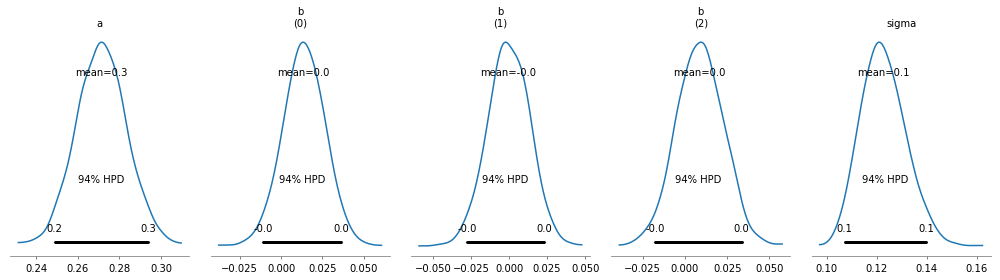

In [27]:
prior_dict = fit.extract(pars=['a','b','sigma'], permuted=False)
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data=['y'], 
                       posterior_predictive=['ypred'], 
                       log_likelihood=fit['log_lik'])
azpos = azfit.posterior.drop(['mu','log_lik'])
az.plot_posterior(azpos, figsize=(14,4))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fce38224198>,
      dtype=object)

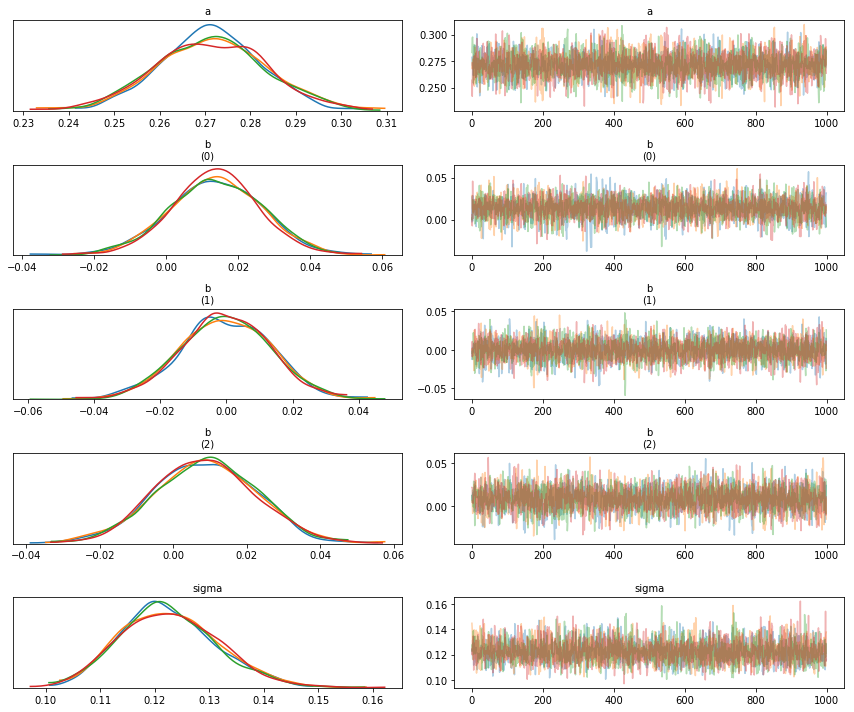

In [28]:
az.plot_trace(azpos)

(<matplotlib.axes._subplots.AxesSubplot at 0x7fce3e370898>, GridSpec(4, 4))

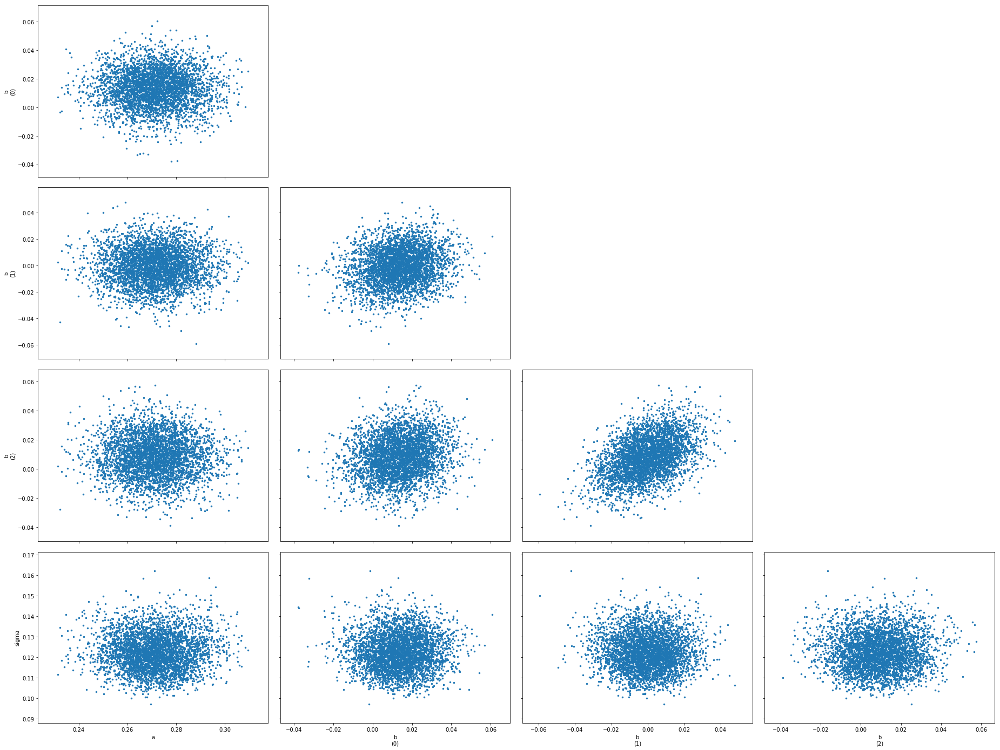

In [29]:
az.plot_pair(azpos)

### __Model check__ | PSIS-LOO

In [30]:
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data='y', 
                       posterior_predictive='ypred', 
                       log_likelihood='log_lik')
az.loo(azfit)

/home/zenist/anaconda3/lib/python3.6/site-packages/mkl_fft/_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:372: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for
        one or more samples. You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal posterior and LOO posterior
        are very different. This is more likely to happen with a non-robust model and highly
        influential observations.
  influential observations."""


,loo,loo_se,p_loo,warning
0,-6317.599543,5485.021601,6477.133081,1


Compared to the uninformative model our loo is actually less for this model which can potentially tell us that the assigned Zellner priors are not a good fit.

### __Predictive accuracy__ | Predict streams for 2018

/home/zenist/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


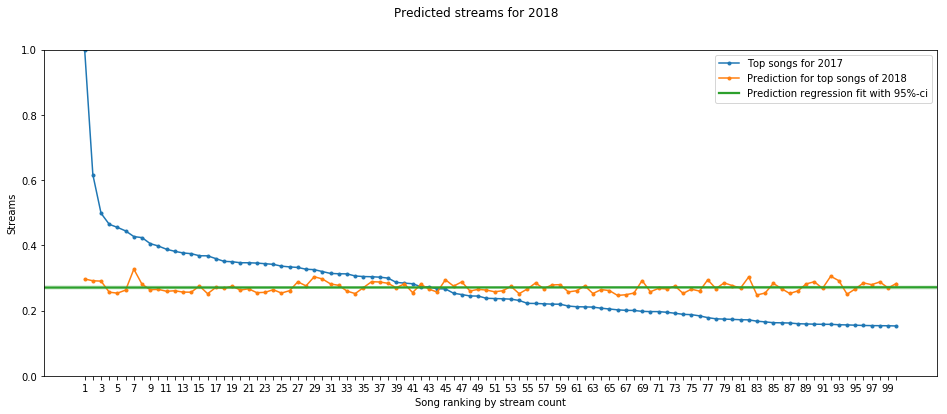

In [31]:
plt.figure(figsize=(16,6))

plt.suptitle('Predicted streams for 2018')
plt.xlabel('Song ranking by stream count')
plt.ylabel('Streams')

plt.ylim(0,1)
plt.xticks(range(1,101),labels=['{0}'.format(i) if i % 2 != 0 else '' for i in range(1,101)])
X_top100 = range(1,101)

plt.plot(X_top100, global_data['streams'], '.-', label='Top songs for 2017')
plt.plot(X_top100, np.mean(samples['ypred'], axis=0),  '.-', label='Prediction for top songs of 2018')
sns.regplot(list(X_top100), list(np.mean(samples['ypred'], axis=0)), 'o-', scatter=False, label='Prediction regression fit with 95%-ci')
plt.legend(loc='best')

## __2.3 Weakly Informative Model 2__ | Five predictors with normal priors
In hope of better results, we will extend the model to include other covariates except energy which based on the exploratory data analysis is strongly collinear with 'loudness' and thus would not satisfy the linearity assumptions of our model. 

Third model will have 5 predictors with normal priors.
Complete model takes the form:

$$ \large Y \sim N(\alpha + \beta_1 X_1 + \beta_2 X_2 + \beta_3 X_3 + \beta_4 X_4 + \beta_5 X_5, \;\sigma)$$

We also extend our priors accordingly.

### __Load model__

In [32]:
filename = 'lin_5_informative.stan'
with open(filename) as file:
    print(file.read())

data{
    // year 2017 top 100 songs
    int N;        // number of data points
    vector[N] y;  // streams
    vector[N] X1; // acousticness
    vector[N] X2; // danceability
    vector[N] X3; // loudness
    vector[N] X4; // tempo
    vector[N] X5; // valence

    // year 2018 top 100 songs
    int Npred;        
    vector[Npred] X1pred; 
    vector[Npred] X2pred;
    vector[Npred] X3pred;
    vector[Npred] X4pred;
    vector[Npred] X5pred;
    
    // prior means 
    real mu_a;
    vector[5] mu_b;
   
    // prior stds
    real sigma_0;
}

parameters{
    real a;
    vector[5] b;
    real<lower=0> sigma;
}

transformed parameters{
    vector[N] mu;
    mu = a + b[1]*X1 + b[2]*X2 + b[3]*X3 + b[4]*X4 + b[5]*X5;
}

model{
    a ~ normal(mu_a, sigma_0);
    b ~ normal(mu_b, sigma_0);    
    y ~ normal(mu, sigma);
}

generated quantities{
    vector[Npred] ypred;
    vector[N] log_lik;
    
    for (j in 1:N){ 
        // logarithmic likelihood for streams (PSIS-LOO)
        log_lik[

In [34]:
gb_2017 = global_data.values
gb_2018 = global_data.values 
data = dict(N=gb_2017.shape[0],
            y=gb_2017[:,0],
            X1=gb_2017[:,1], X2=gb_2017[:,2], X3=gb_2017[:,4], X4=gb_2017[:,5], X5=gb_2017[:,6],
            Npred=gb_2018.shape[0], 
            X1pred=gb_2018[:,1], X2pred=gb_2018[:,2], X3pred=gb_2018[:,4], X4pred=gb_2018[:,5], X5pred=gb_2018[:,6],
            mu_a=0,
            mu_b=[0,0,0,0,0],
            sigma_0=0.12*10) # Approximately the first model's result for std of priors x 2

### __Fit model__

In [35]:
# Load compiled model if available
fit = None
try:
  fit = load_model('lin_5_informative.stan.saved')
except Exception: 
  fit = pystan.stan(file=filename, data=data, seed=42)
  save_model(fit, filename + '.saved')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_9e12de3a3b666024c75563a0229d8c62 NOW.
/home/zenist/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.
  after removing the cwd from sys.path.


In [36]:
samples = fit.extract(permuted=True)

### __Simulation results__ | Posterior

In [37]:
summary = fit.summary(pars = ['a','b','sigma','ypred',]) 
fit_sum = pd.DataFrame(summary['summary'],
                  index=summary['summary_rownames'],
                  columns = summary['summary_colnames'])

fit_sum.iloc[0:10,0:10]

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
a,0.270827,0.000160,0.012157,0.247550,0.262636,0.270808,0.278747,0.295256,5789.332664,0.999781
b[1],0.013269,0.000188,0.013239,-0.012080,0.004275,0.013367,0.021916,0.039518,4957.016982,0.999716
b[2],-0.004865,0.000236,0.014710,-0.033652,-0.014701,-0.005026,0.005148,0.024085,3877.912196,0.999989
b[3],0.007401,0.000217,0.014021,-0.019332,-0.002273,0.007362,0.017020,0.035164,4180.587816,0.999741
b[4],0.009990,0.000197,0.013401,-0.017330,0.001171,0.009962,0.018764,0.036585,4643.075073,1.000370
b[5],0.016190,0.000218,0.014809,-0.013212,0.006471,0.015742,0.026192,0.045070,4600.495784,0.999334
sigma,0.121884,0.000132,0.009161,0.105583,0.115295,0.121338,0.127900,0.141218,4814.395149,0.999434
ypred[1],0.329802,0.002022,0.130263,0.078984,0.242611,0.328532,0.416270,0.595538,4151.063229,0.999470
ypred[2],0.325713,0.002033,0.126106,0.079186,0.237498,0.328858,0.412027,0.573635,3848.544713,0.999733
ypred[3],0.323333,0.001984,0.126796,0.076211,0.240248,0.323667,0.407186,0.576460,4083.122885,0.999248


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fce3e212e48>,
      dtype=object)

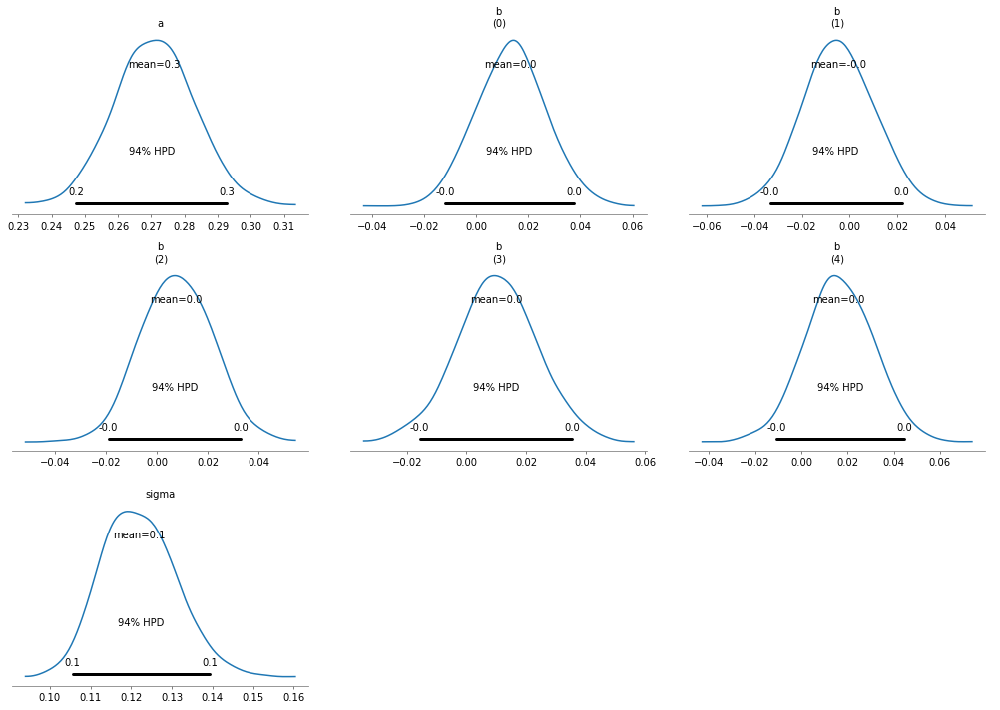

In [38]:
prior_dict = fit.extract(pars=['a','b','sigma'], permuted=False)
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data=['y'], 
                       posterior_predictive=['ypred'], 
                       log_likelihood=fit['log_lik'])
azpos = azfit.posterior.drop(['mu','log_lik'])
az.plot_posterior(azpos, figsize=(14,10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fce2b1ebef0>,
      dtype=object)

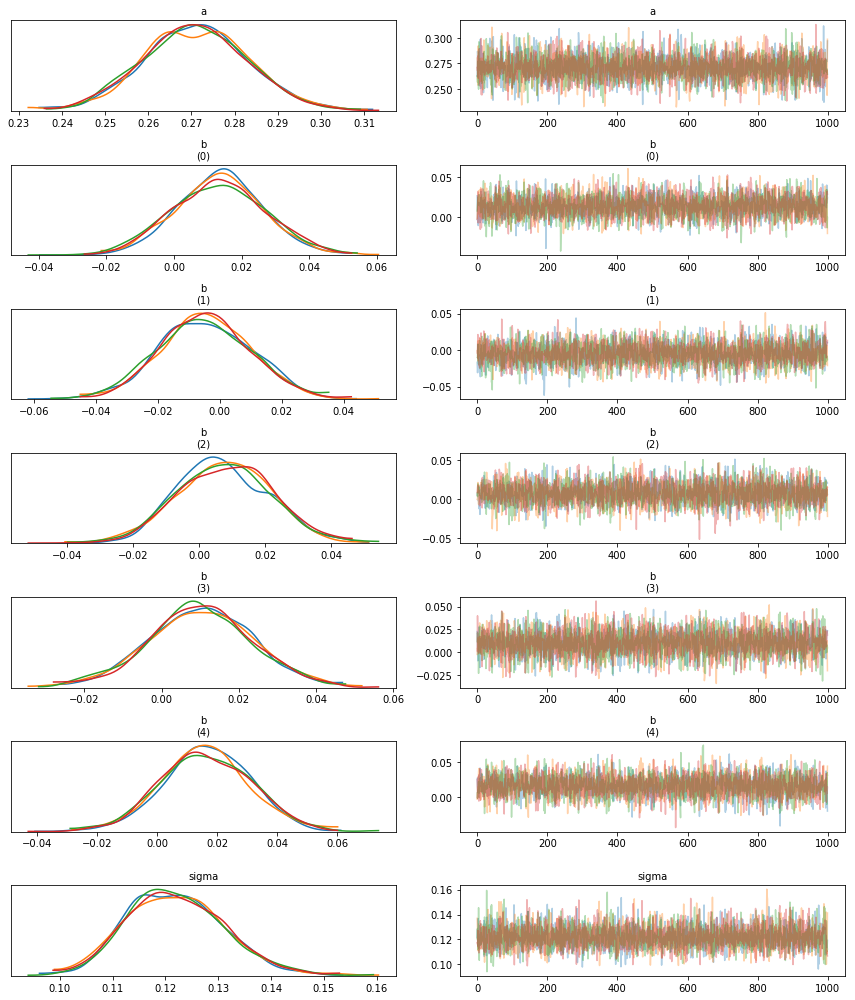

In [39]:
az.plot_trace(azpos)

(<matplotlib.axes._subplots.AxesSubplot at 0x7fce2bedd518>, GridSpec(6, 6))

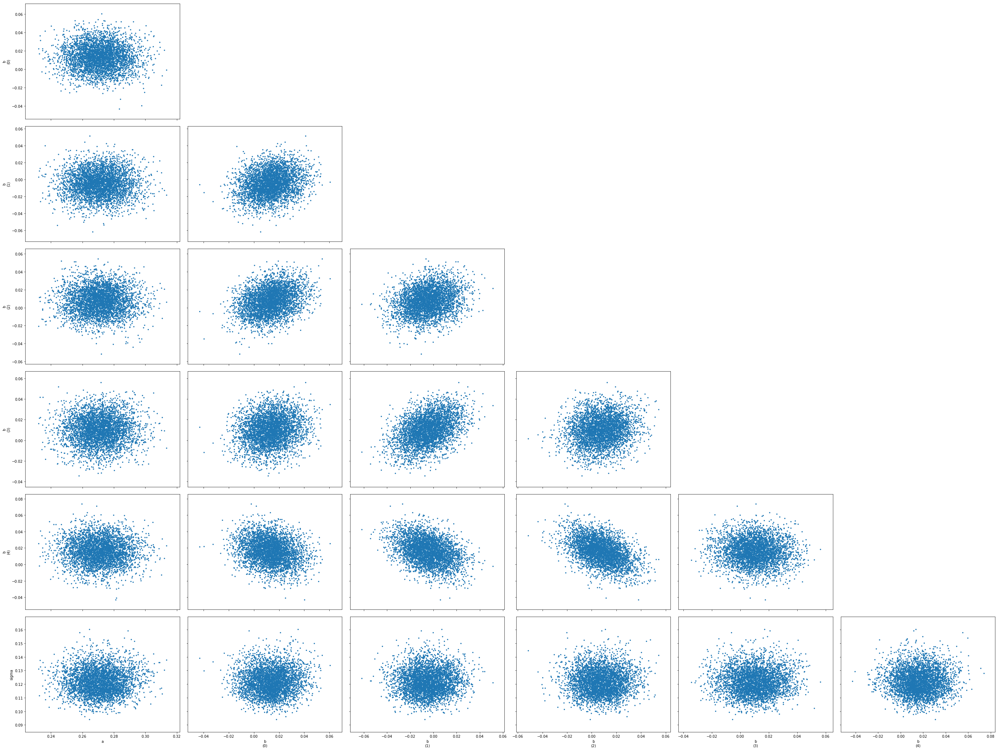

In [40]:
az.plot_pair(azpos)

### __Model check__ | PSIS-LOO

In [41]:
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data='y', 
                       posterior_predictive='ypred', 
                       log_likelihood='log_lik')
az.loo(azfit)

/home/zenist/anaconda3/lib/python3.6/site-packages/mkl_fft/_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:372: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for
        one or more samples. You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal posterior and LOO posterior
        are very different. This is more likely to happen with a non-robust model and highly
        influential observations.
  influential observations."""


,loo,loo_se,p_loo,warning
0,-4801.452391,5885.211137,7154.993334,1


### __Predictive accuracy__ | Predict streams for 2018 top 100 

/home/zenist/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


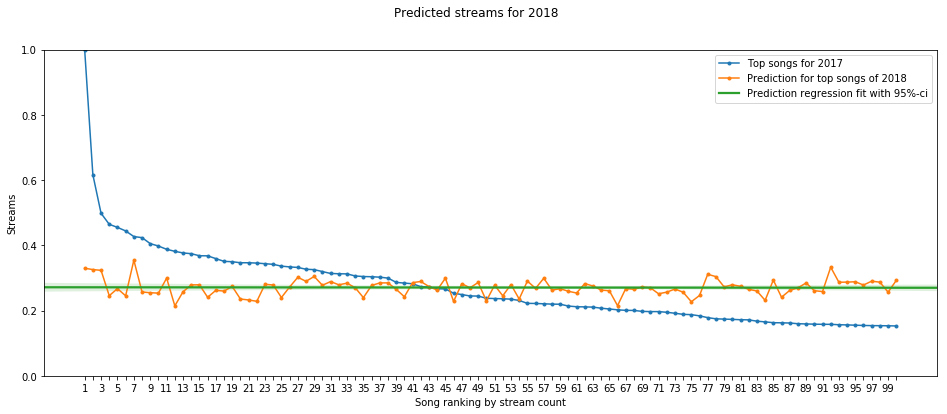

In [42]:
plt.figure(figsize=(16,6))

plt.suptitle('Predicted streams for 2018')
plt.xlabel('Song ranking by stream count')
plt.ylabel('Streams')

plt.ylim(0,1)
plt.xticks(range(1,101),labels=['{0}'.format(i) if i % 2 != 0 else '' for i in range(1,101)])
X_top100 = range(1,101)

plt.plot(X_top100, global_data['streams'], '.-', label='Top songs for 2017')
plt.plot(X_top100, np.mean(samples['ypred'], axis=0),  '.-', label='Prediction for top songs of 2018')
sns.regplot(list(X_top100), list(np.mean(samples['ypred'], axis=0)), 'o-', scatter=False, label='Prediction regression fit with 95%-ci')
plt.legend(loc='best')

## __2.4 Extended model 1__ | Adding interaction terms
In the exploratory data analysis part of this analysis we identified multiple potential collinear relationships between covariates. We will now relax the linearity assumption of the model and introduce two new interaction terms. 

Interaction terms model:
1. potential positive collinearity between `valence` and `loudness`
2. negative collinearity between `tempo` and `danceability`.

This model will have 5 predictors with normal priors and altogether 7 parameters.
Complete model takes the form:

$$ \large Y \sim N(\alpha + \beta_1 X_1 + \beta_2 X_2 + \beta_3 X_3 + \beta_4 X_4 + \beta_5 X_5 + \beta_6 X_2 X_4 + \beta_7 X_3 X_5, \;\sigma)$$

We also extend our Zellner's priors accordingly.

### __Load model__

In [43]:
filename = 'lin_5_informative-interaction.stan'
with open(filename) as file:
    print(file.read())

data{
    // year 2017 top 100 songs
    int N;        // number of data points
    vector[N] y;  // streams
    vector[N] X1; // acousticness
    vector[N] X2; // danceability
    vector[N] X3; // loudness
    vector[N] X4; // tempo
    vector[N] X5; // valence

    // year 2018 top 100 songs
    int Npred;        
    vector[Npred] X1pred; 
    vector[Npred] X2pred;
    vector[Npred] X3pred;
    vector[Npred] X4pred;
    vector[Npred] X5pred;
    
    // prior means 
    real mu_a;
    vector[7] mu_b;
   
    // prior stds
    real sigma_0;
}

parameters{
    real a;
    vector[7] b;
    real<lower=0> sigma;
}

transformed parameters{
    vector[N] mu;
    vector[N] X2X4;
    vector[N] X3X5;
    
    X2X4 = X2 .* X4;
    X3X5 = X3 .* X5;
    
    mu = a + b[1]*X1 + b[2]*X2 + b[3]*X3 + b[4]*X4 + b[5]*X5 + b[6]*X2X4 + b[7]*X3X5;
}

model{
    a ~ normal(mu_a, sigma_0);
    b ~ normal(mu_b, sigma_0);
    y ~ normal(mu, sigma);
}

generated quantities{
    vector[Npred] ypred;
    vector

In [44]:
gb_2017 = global_data.values
gb_2018 = global_data.values # We need to query the API for 2018 data and pre-process it. Finnish data is used for demonstration. 
data = dict(N=gb_2017.shape[0],
            y=gb_2017[:,0],
            X1=gb_2017[:,1], X2=gb_2017[:,2], X3=gb_2017[:,4], X4=gb_2017[:,5], X5=gb_2017[:,6],
            Npred=gb_2018.shape[0], 
            X1pred=gb_2018[:,1], X2pred=gb_2018[:,2], X3pred=gb_2018[:,4], X4pred=gb_2018[:,5], X5pred=gb_2018[:,6],
            mu_a=0,
            mu_b=np.zeros(7),
            sigma_0=0.12*10)

### __Fit model__

In [45]:
# Load compiled model if available
fit = None
try:
  fit = load_model('lin_5_informative-interaction.stan.saved')
except Exception: 
  fit = pystan.stan(file=filename, data=data, seed=42)
  save_model(fit, filename + '.saved')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_9f4667fcc74979b58171eacadb9ab02d NOW.
/home/zenist/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.
  after removing the cwd from sys.path.


In [46]:
samples = fit.extract(permuted=True)

### __Simulation results__ | Posterior

In [47]:
summary = fit.summary(pars = ['a','b','sigma','ypred',]) 
fit_sum = pd.DataFrame(summary['summary'],
                  index=summary['summary_rownames'],
                  columns = summary['summary_colnames'])

fit_sum.iloc[0:9,0:10]

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
a,0.267400,0.000182,0.013223,0.242442,0.258626,0.267165,0.276221,0.293777,5262.676189,0.999721
b[1],0.014305,0.000180,0.012737,-0.011333,0.006050,0.014440,0.022735,0.039012,5007.295305,0.999327
b[2],-0.009241,0.000231,0.015471,-0.040218,-0.019475,-0.009444,0.001113,0.021241,4487.905892,0.999530
b[3],0.013154,0.000217,0.014234,-0.014748,0.003689,0.012914,0.022736,0.040303,4298.068065,0.999231
b[4],0.021967,0.000230,0.015100,-0.007533,0.011646,0.021866,0.031994,0.051940,4314.483692,0.999680
b[5],0.016292,0.000221,0.014410,-0.011434,0.006843,0.015950,0.025981,0.044959,4263.800801,0.999606
b[6],0.016341,0.000172,0.011204,-0.006083,0.008937,0.016158,0.023935,0.038025,4265.843643,1.000305
b[7],0.025336,0.000179,0.012535,0.000840,0.016970,0.025359,0.033447,0.049930,4886.540916,1.000151
sigma,0.119901,0.000119,0.008957,0.104307,0.113519,0.119188,0.125394,0.139020,5707.760001,0.999837


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fce2b85d470>,
      dtype=object)

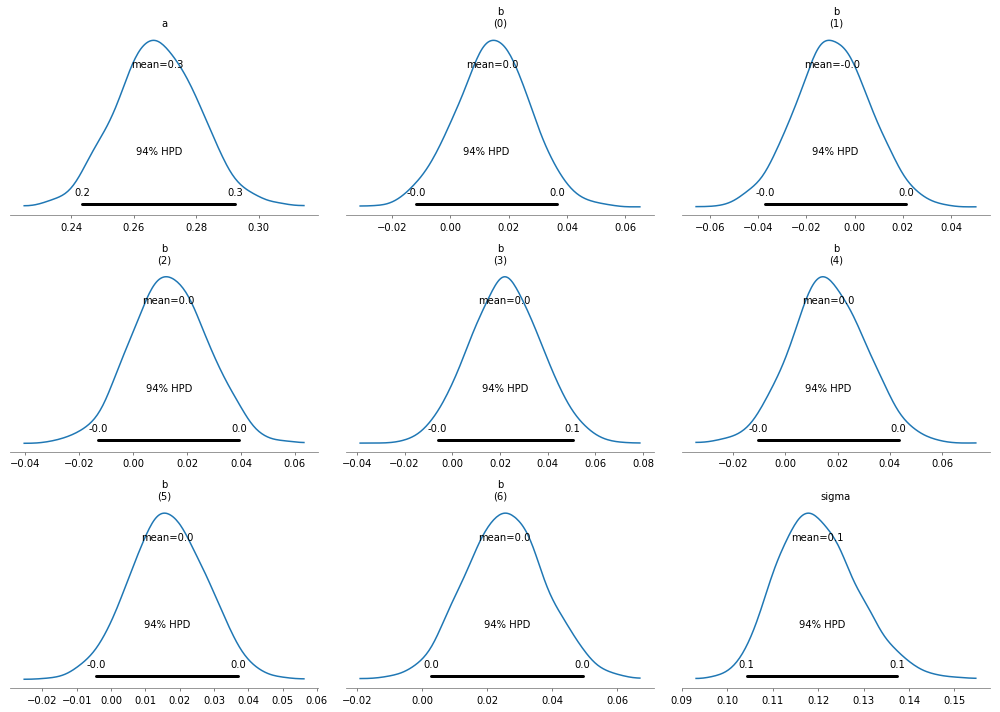

In [48]:
prior_dict = fit.extract(pars=['a','b','sigma'], permuted=False)
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data=['y'], 
                       posterior_predictive=['ypred'], 
                       log_likelihood=fit['log_lik'])
azpos = azfit.posterior[['a','b','sigma']]
az.plot_posterior(azpos, figsize=(14,10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fce28928358>,
      dtype=object)

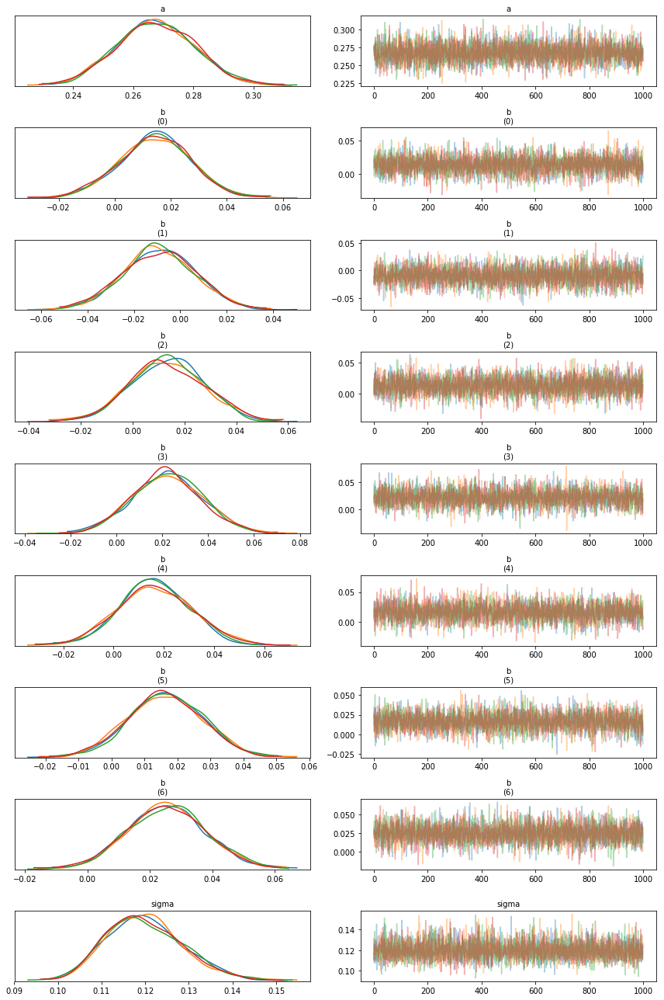

In [49]:
az.plot_trace(azpos)

(<matplotlib.axes._subplots.AxesSubplot at 0x7fce38126b70>, GridSpec(8, 8))

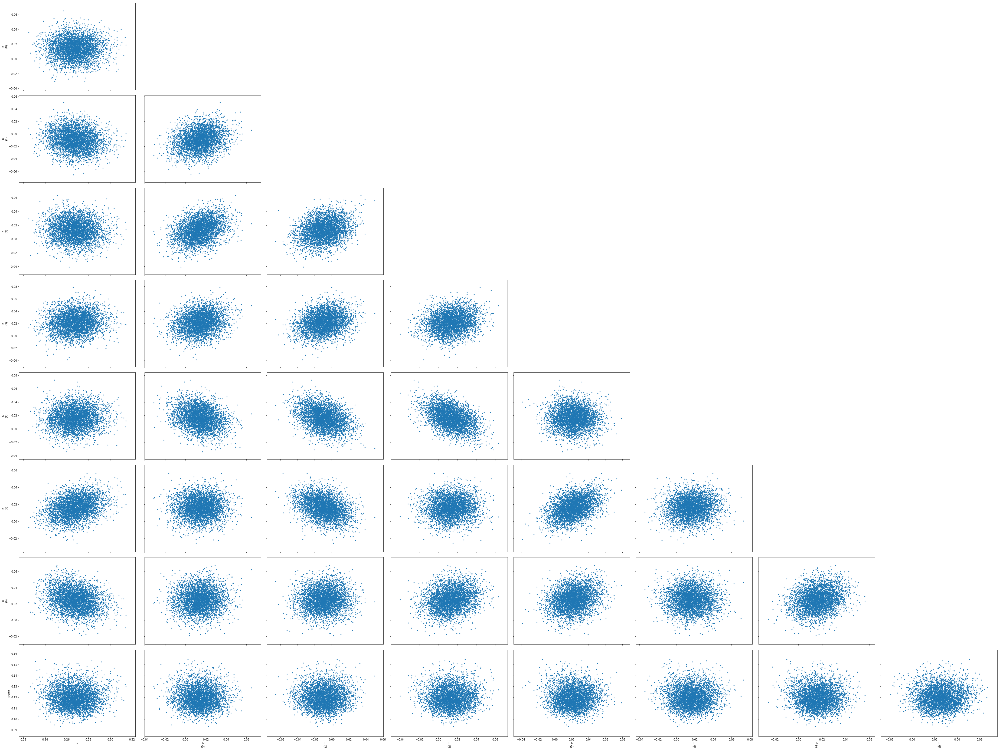

In [50]:
az.plot_pair(azpos)

### __Model check__ | PSIS-LOO

In [51]:
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data='y', 
                       posterior_predictive='ypred', 
                       log_likelihood='log_lik')
az.loo(azfit)

/home/zenist/anaconda3/lib/python3.6/site-packages/mkl_fft/_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/diagnostics.py:140: RuntimeWarning: invalid value encountered in true_divide
  acorr /= acorr[0]
/home/zenist/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:36: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial)
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:372: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for
        one or more samples. You should consider using a more robust model, this is because
        i

,loo,loo_se,p_loo,warning
0,-3881.555915,6005.448766,7405.696576,1


### __Predictive accuracy__ | Predict streams for 2018

/home/zenist/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


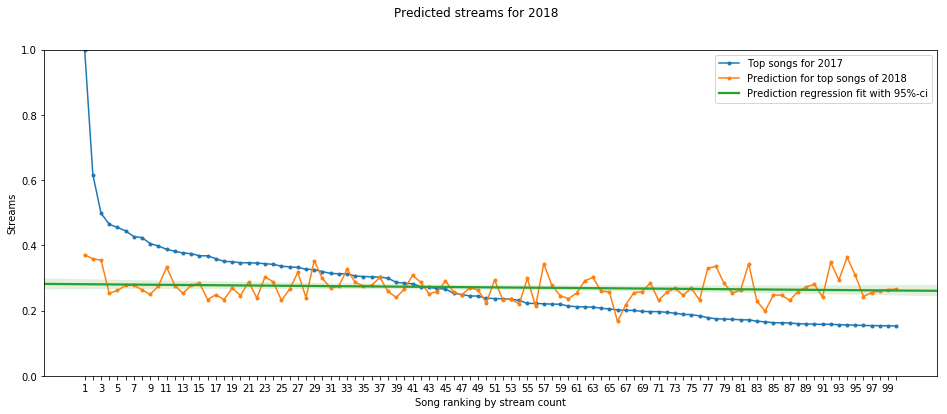

In [52]:
plt.figure(figsize=(16,6))

plt.suptitle('Predicted streams for 2018')
plt.xlabel('Song ranking by stream count')
plt.ylabel('Streams')

plt.ylim(0,1)
plt.xticks(range(1,101),labels=['{0}'.format(i) if i % 2 != 0 else '' for i in range(1,101)])
X_top100 = range(1,101)

plt.plot(X_top100, global_data['streams'], '.-', label='Top songs for 2017')
plt.plot(X_top100, np.mean(samples['ypred'], axis=0),  '.-', label='Prediction for top songs of 2018')
sns.regplot(list(X_top100), list(np.mean(samples['ypred'], axis=0)), 'o-', scatter=False, label='Prediction regression fit with 95%-ci')
plt.legend(loc='best')

## __2.5 Extended model 2__ | Extending interaction terms 
In the exploratory data analysis part of this analysis we also plotted simple regression lines using three variables. There we noticed a possible dependence of valence with three different covariates. We already modeled the dependence with `loudness` using interaction term. Now we extend the model to include also the following interaction terms: 

1. potential positive collinearity between `valence` and `danceability`
2. potential positivie collinearity between `valence` and `acousticness`.

This model will have 5 predictors with normal priors and altogether 7 parameters.
Complete model takes the form:

$$ \large Y \sim N(\alpha + \beta_1 X_1 + \beta_2 X_2 + \beta_3 X_3 + \beta_4 X_4 + \beta_5 X_5 + \beta_6 X_2 X_4 + \beta_7 X_3 X_5 + \beta_8 X_1 X_5 + \beta_9 X_2 X_5, \;\sigma)$$

We also extend our Zellner's priors accordingly.

### __Load model__

In [6]:
filename = 'lin_5_informative-interaction2.stan'
with open(filename) as file:
    print(file.read())

data{
    // year 2017 top 100 songs
    int N;        // number of data points
    vector[N] y;  // streams
    vector[N] X1; // acousticness
    vector[N] X2; // danceability
    vector[N] X3; // loudness
    vector[N] X4; // tempo
    vector[N] X5; // valence

    // year 2018 top 100 songs
    int Npred;        
    vector[Npred] X1pred; 
    vector[Npred] X2pred;
    vector[Npred] X3pred;
    vector[Npred] X4pred;
    vector[Npred] X5pred;
    
    // prior means 
    real mu_a;
    vector[9] mu_b;
   
    // prior stds
    real sigma_0;
}

parameters{
    real a;
    vector[9] b;
    real<lower=0> sigma;
}

transformed parameters{
    vector[N] mu;
    vector[N] X2X4;
    vector[N] X1X5;
    vector[N] X2X5;
    vector[N] X3X5;
    
    X1X5 = X1 .* X5;
    X2X5 = X2 .* X5;
    X3X5 = X3 .* X5;
    X2X4 = X2 .* X4;
    
    mu = a + b[1]*X1 + b[2]*X2 + b[3]*X3 + b[4]*X4 + b[5]*X5 + b[6]*X2X4 + b[7]*X3X5 + b[8]*X1X5 + b[9]*X2X5;
}

model{
    a ~ normal(mu_a, sigma_0);
    b ~ norm

In [7]:
gb_2017 = global_data.values
gb_2018 = global_data.values # We need to query the API for 2018 data and pre-process it. Finnish data is used for demonstration. 
data = dict(N=gb_2017.shape[0],
            y=gb_2017[:,0],
            X1=gb_2017[:,1], X2=gb_2017[:,2], X3=gb_2017[:,4], X4=gb_2017[:,5], X5=gb_2017[:,6],
            Npred=gb_2018.shape[0], 
            X1pred=gb_2018[:,1], X2pred=gb_2018[:,2], X3pred=gb_2018[:,4], X4pred=gb_2018[:,5], X5pred=gb_2018[:,6],
            mu_a=0,
            mu_b=np.zeros(9),
            sigma_0=0.12*10)

### __Fit model__

In [8]:
# Load compiled model if available
fit = None
try:
  fit = load_model('lin_5_informative-interaction2.stan.saved')
except Exception: 
  fit = pystan.stan(file=filename, data=data, seed=42)
  save_model(fit, filename + '.saved')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_a787b7534978d7cc77c06fa8890675be NOW.
/home/zenist/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.
  after removing the cwd from sys.path.


In [9]:
samples = fit.extract(permuted=True)

### __Simulation results__ | Posterior

In [10]:
summary = fit.summary(pars = ['a','b','sigma','ypred',]) 
fit_sum = pd.DataFrame(summary['summary'],
                  index=summary['summary_rownames'],
                  columns = summary['summary_colnames'])

fit_sum.iloc[0:11,0:10]

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
a,0.265175,0.000164,0.011723,0.242498,0.257289,0.265142,0.273069,0.288306,5097.521052,1.000121
b[1],0.006022,0.000188,0.011641,-0.016612,-0.001817,0.006333,0.013894,0.028967,3833.650831,1.000134
b[2],-0.031790,0.000277,0.014453,-0.059850,-0.041927,-0.031777,-0.021935,-0.003689,2732.108141,0.999623
b[3],-0.002110,0.000216,0.012646,-0.027085,-0.010412,-0.002152,0.006227,0.023178,3441.212086,1.000103
b[4],0.007618,0.000222,0.012978,-0.017687,-0.000852,0.007416,0.016167,0.034071,3419.496494,1.001810
b[5],0.036790,0.000240,0.013160,0.010547,0.027762,0.037084,0.045724,0.061913,3013.427074,0.999846
b[6],0.022473,0.000169,0.010208,0.002709,0.015498,0.022594,0.029503,0.041934,3661.318120,1.000193
b[7],0.034708,0.000160,0.010864,0.013809,0.027309,0.034701,0.042116,0.056444,4609.771387,0.999384
b[8],0.067797,0.000196,0.012572,0.043120,0.059539,0.067584,0.076090,0.092594,4105.844332,0.999871
b[9],-0.011343,0.000149,0.009942,-0.030081,-0.018181,-0.011443,-0.004610,0.008068,4423.172600,1.000158


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff7f42069e8>,
      dtype=object)

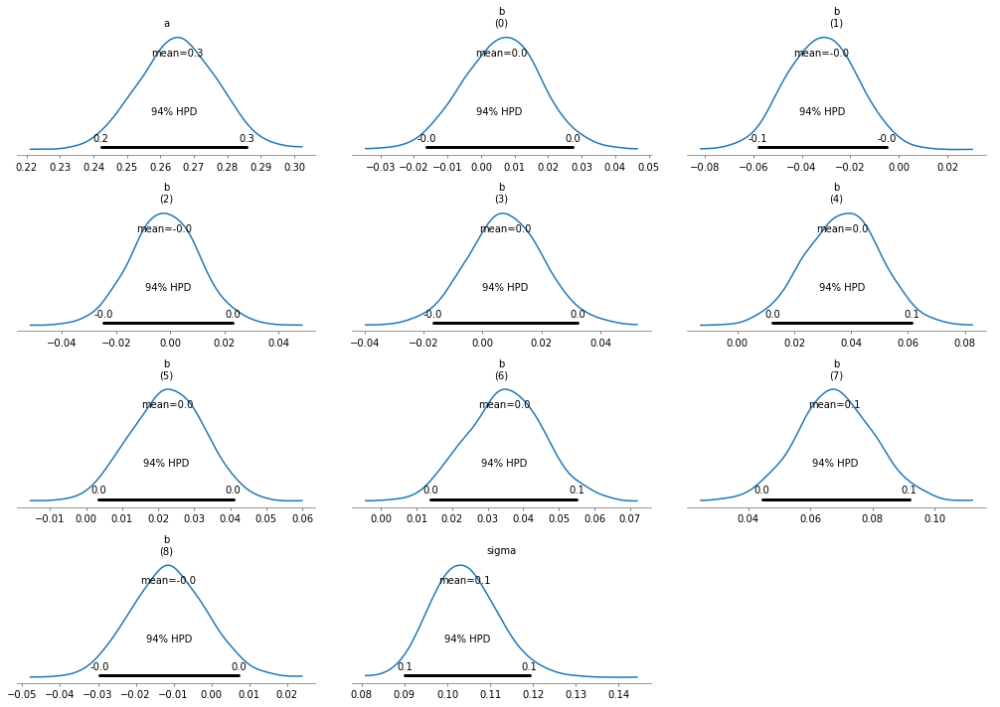

In [11]:
prior_dict = fit.extract(pars=['a','b','sigma'], permuted=False)
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data=['y'], 
                       posterior_predictive=['ypred'], 
                       log_likelihood=fit['log_lik'])
azpos = azfit.posterior[['a','b','sigma']]
az.plot_posterior(azpos, figsize=(14,10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff7e5d2af98>,
      dtype=object)

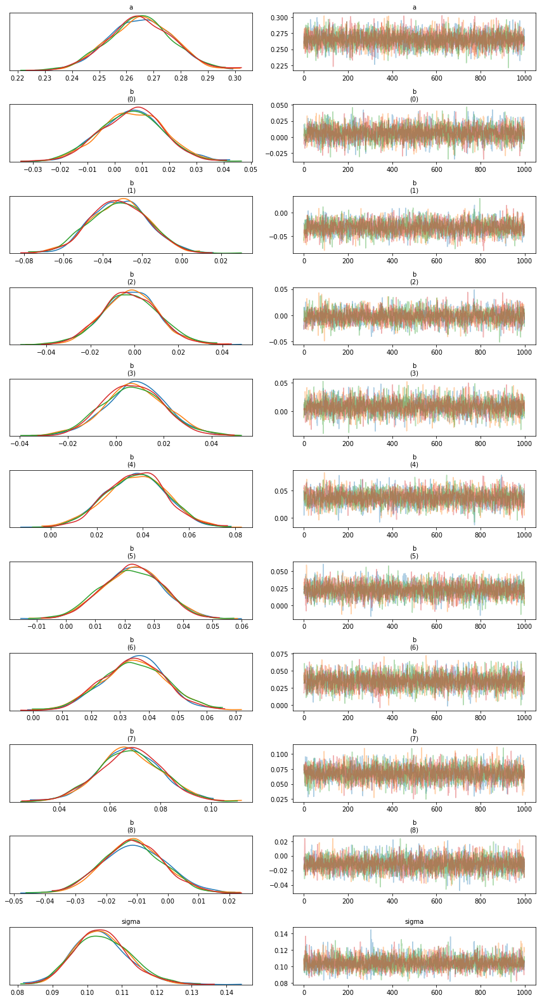

In [19]:
az.plot_trace(azpos)

### __Model check__ | PSIS-LOO

In [13]:
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data='y', 
                       posterior_predictive='ypred', 
                       log_likelihood='log_lik')
az.loo(azfit)

/home/zenist/anaconda3/lib/python3.6/site-packages/mkl_fft/_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/diagnostics.py:140: RuntimeWarning: invalid value encountered in true_divide
  acorr /= acorr[0]
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:530: RuntimeWarning: overflow encountered in expm1
  x = np.expm1(-kappa * np.log1p(-probs)) / kappa
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:372: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for
        one or more samples. You should consider using a more robust model, this is because
        importance

,loo,loo_se,p_loo,warning
0,3384.107896,7946.064629,9695.733776,1


### __Predictive accuracy__ | Predict streams for 2018

/home/zenist/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


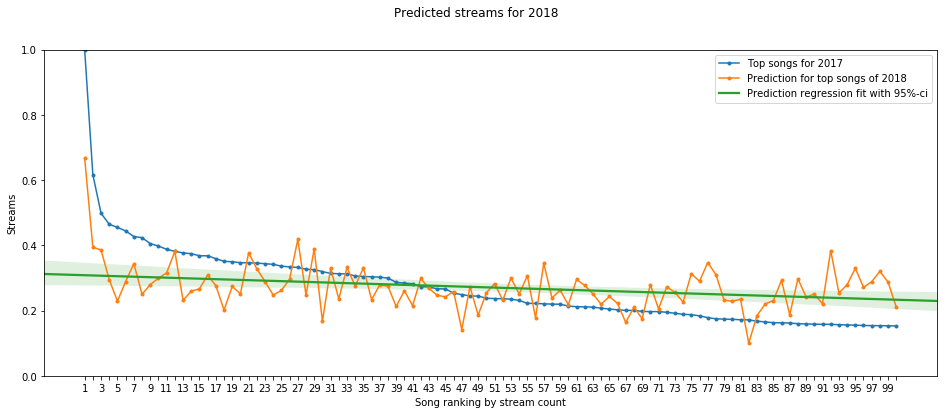

In [14]:
plt.figure(figsize=(16,6))

plt.suptitle('Predicted streams for 2018')
plt.xlabel('Song ranking by stream count')
plt.ylabel('Streams')

plt.ylim(0,1)
plt.xticks(range(1,101),labels=['{0}'.format(i) if i % 2 != 0 else '' for i in range(1,101)])
X_top100 = range(1,101)

plt.plot(X_top100, global_data['streams'], '.-', label='Top songs for 2017')
plt.plot(X_top100, np.mean(samples['ypred'], axis=0),  '.-', label='Prediction for top songs of 2018')
sns.regplot(list(X_top100), list(np.mean(samples['ypred'], axis=0)), 'o-', scatter=False, label='Prediction regression fit with 95%-ci')
plt.legend(loc='best')

Adding interaction terms seems to affect the prediction capability, while loo still stays close to the earlier model's loo.

## __2.5 Extended model 2__ | Adding second order polynomials
We will now relax the linearity assumptions even further by adding higher order polynomial terms.

This model will have 5 predictors with normal priors, two interaction terms and newly introduced second order terms.
Complete model takes the form:

$$ Y \sim N(\alpha + \beta_1 X_1 + \beta_2 X_2 + \beta_3 X_3 + \beta_4 X_4 + \beta_5 X_5 + \beta_6 X_1^2 + \beta_7 X_2^2 + \beta_8 X_3^2 + \beta_9 X_4^2 + \beta_{10} X_5^2 + \beta_{11} X_2 X_4 + \beta_{12} X_3 X_5, \;\sigma)$$

We also extend our Zellner's priors accordingly.

### __Load model__

In [6]:
filename = 'lin_5_informative-second_order.stan'
with open(filename) as file:
    print(file.read())

data{
    // year 2017 top 100 songs
    int N;        // number of data points
    vector[N] y;  // streams
    vector[N] X1; // acousticness
    vector[N] X2; // danceability
    vector[N] X3; // loudness
    vector[N] X4; // tempo
    vector[N] X5; // valence

    // year 2018 top 100 songs
    int Npred;        
    vector[Npred] X1pred; 
    vector[Npred] X2pred;
    vector[Npred] X3pred;
    vector[Npred] X4pred;
    vector[Npred] X5pred;
    
    // prior means 
    real mu_a;
    vector[12] mu_b;
   
    // prior stds
    real sigma_0;
}

parameters{
    real a;
    vector[12] b;
    real<lower=0> sigma;
}

transformed parameters{
    vector[N] mu;
    vector[N] X2X4;
    vector[N] X3X5;
    vector[N] X11;
    vector[N] X22;
    vector[N] X33;
    vector[N] X44;
    vector[N] X55;
    
    X11 = X1 .* X1;
    X22 = X2 .* X2;
    X33 = X3 .* X3;
    X44 = X4 .* X4;
    X55 = X5 .* X5;
    
    X2X4 = X2 .* X4;
    X3X5 = X3 .* X5;
    
    mu = a + b[1]*X1 + b[2]*X2 + b[3]*X3 + 

In [7]:
gb_2017 = global_data.values
gb_2018 = global_data.values # We need to query the API for 2018 data and pre-process it. Finnish data is used for demonstration. 
data = dict(N=gb_2017.shape[0],
            y=gb_2017[:,0],
            X1=gb_2017[:,1], X2=gb_2017[:,2], X3=gb_2017[:,4], X4=gb_2017[:,5], X5=gb_2017[:,6],
            Npred=gb_2018.shape[0], 
            X1pred=gb_2018[:,1], X2pred=gb_2018[:,2], X3pred=gb_2018[:,4], X4pred=gb_2018[:,5], X5pred=gb_2018[:,6],
            mu_a=0,
            mu_b=np.zeros(12),
            sigma_0=0.12*10)

### __Fit model__

In [8]:
# Load compiled model if available
fit = None
try:
  fit = load_model('lin_5_informative-second_order.stan.saved')
except Exception: 
  fit = pystan.stan(file=filename, data=data, seed=42)
  save_model(fit, filename + '.saved')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_2d5b7577dc304a3aff7b350232a7267c NOW.
/home/zenist/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.
  after removing the cwd from sys.path.


In [9]:
samples = fit.extract(permuted=True)

### __Simulation results__ | Posterior

In [10]:
summary = fit.summary(pars = ['a','b','sigma','ypred',]) 
fit_sum = pd.DataFrame(summary['summary'],
                  index=summary['summary_rownames'],
                  columns = summary['summary_colnames'])

fit_sum.iloc[0:14,0:10]

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
a,0.246055,0.000526,0.025956,0.194683,0.228779,0.245856,0.263383,0.297093,2431.046395,0.999593
b[1],-0.007974,0.000326,0.018080,-0.042344,-0.020491,-0.008102,0.004206,0.027263,3077.998702,0.999813
b[2],-0.003842,0.000257,0.016360,-0.036509,-0.014272,-0.003664,0.007064,0.027926,4054.485211,0.999575
b[3],0.004607,0.000274,0.015481,-0.025347,-0.005848,0.004583,0.015023,0.034250,3202.378192,1.000358
b[4],0.028662,0.000257,0.016304,-0.002577,0.017609,0.028629,0.039615,0.061294,4035.787988,0.999863
b[5],0.017707,0.000244,0.014951,-0.011574,0.007893,0.017841,0.027900,0.046446,3759.323133,0.999725
b[6],0.025595,0.000230,0.011955,0.002131,0.017786,0.025550,0.033732,0.048787,2694.340505,1.000291
b[7],-0.008585,0.000143,0.009440,-0.027524,-0.014923,-0.008538,-0.002342,0.010255,4343.875090,0.999400
b[8],-0.010509,0.000161,0.009369,-0.029019,-0.016799,-0.010497,-0.004427,0.007845,3378.419973,1.000274
b[9],-0.004578,0.000250,0.012813,-0.029170,-0.013276,-0.004608,0.003775,0.020690,2629.112161,1.000067


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fb7ec7f8f60>,
      dtype=object)

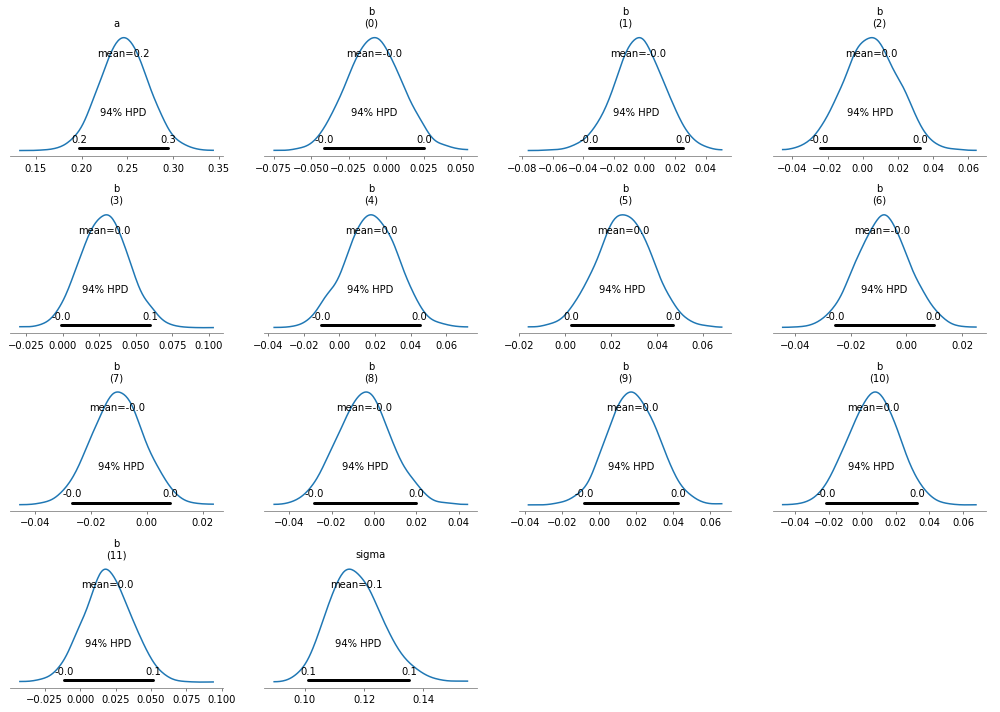

In [11]:
prior_dict = fit.extract(pars=['a','b','sigma'], permuted=False)
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data=['y'], 
                       posterior_predictive=['ypred'], 
                       log_likelihood=fit['log_lik'])
azpos = azfit.posterior[['a','b','sigma']]
az.plot_posterior(azpos, figsize=(14,10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb7ebc5c080>,
      dtype=object)

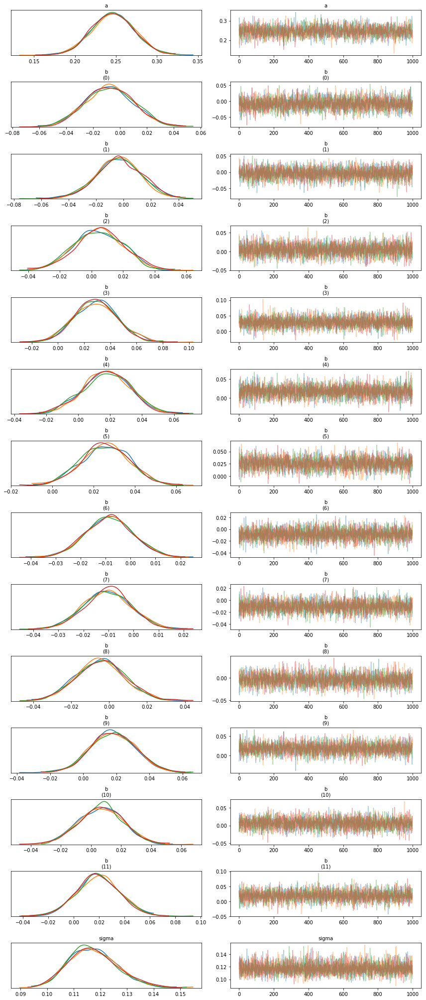

In [12]:
az.plot_trace(azpos)

Unfortunately plotting ~ 80 pairplots wasn't practical.
However we can already see that the distributions are very similar to earlier models. Let's move on to PSIS-LOO calculations: 
### __Model check__ | PSIS-LOO

In [13]:
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data='y', 
                       posterior_predictive='ypred', 
                       log_likelihood='log_lik')
az.loo(azfit)

/home/zenist/anaconda3/lib/python3.6/site-packages/mkl_fft/_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/diagnostics.py:140: RuntimeWarning: invalid value encountered in true_divide
  acorr /= acorr[0]
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:372: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for
        one or more samples. You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal posterior and LOO posterior
        are very different. This is more likely to happen with a non-robust model and highl

,loo,loo_se,p_loo,warning
0,-775.648751,6226.299107,8654.426161,1


### __Predictive accuracy__ | Predict streams for 2018

/home/zenist/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


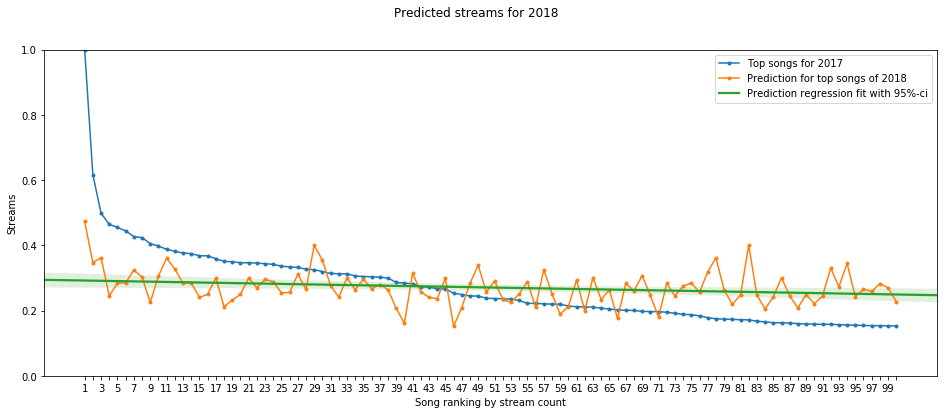

In [14]:
plt.figure(figsize=(16,6))

plt.suptitle('Predicted streams for 2018')
plt.xlabel('Song ranking by stream count')
plt.ylabel('Streams')

plt.ylim(0,1)
plt.xticks(range(1,101),labels=['{0}'.format(i) if i % 2 != 0 else '' for i in range(1,101)])
X_top100 = range(1,101)

plt.plot(X_top100, global_data['streams'], '.-', label='Top songs for 2017')
plt.plot(X_top100, np.mean(samples['ypred'], axis=0),  '.-', label='Prediction for top songs of 2018')
sns.regplot(list(X_top100), list(np.mean(samples['ypred'], axis=0)), 'o-', scatter=False, label='Prediction regression fit with 95%-ci')
plt.legend(loc='best')

## __2.5 Extended model 4__ | Adding second order polynomials (with interaction terms)
We will now relax the linearity assumptions even further by adding higher order polynomial terms.

This model will have 5 predictors with normal priors, two interaction terms and newly introduced second order terms.
Complete model takes the form:

$$ Y \sim N(\alpha + \beta_1 X_1 + \beta_2 X_2 + \beta_3 X_3 + \beta_4 X_4 + \beta_5 X_5 + \beta_6 X_1^2 + \beta_7 X_2^2 + \beta_8 X_3^2 + \beta_9 X_4^2 + \beta_{10} X_5^2 + \beta_{11} X_2 X_4 + \beta_{12} X_3 X_5 +\beta_{13} X_1 X_5 + \beta_{14} X_2 X_5, \;\sigma)$$

We also extend our (normal) priors accordingly.

### __Load model__

In [118]:
filename = 'lin_5_informative-second_order-inter.stan'
with open(filename) as file:
    print(file.read())

data{
    // year 2017 top 100 songs
    int N;        // number of data points
    vector[N] y;  // streams
    vector[N] X1; // acousticness
    vector[N] X2; // danceability
    vector[N] X3; // loudness
    vector[N] X4; // tempo
    vector[N] X5; // valence

    // year 2018 top 100 songs
    int Npred;        
    vector[Npred] X1pred; 
    vector[Npred] X2pred;
    vector[Npred] X3pred;
    vector[Npred] X4pred;
    vector[Npred] X5pred;
    
    // prior means 
    real mu_a;
    vector[14] mu_b;
   
    // prior stds
    real sigma_0;
}

parameters{
    real a;
    vector[14] b;
    real<lower=0> sigma;
}

transformed parameters{
    vector[N] mu;
    vector[N] X2X4;
    vector[N] X1X5;
    vector[N] X2X5;
    vector[N] X3X5;
    vector[N] X11;
    vector[N] X22;
    vector[N] X33;
    vector[N] X44;
    vector[N] X55;
    
    X1X5 = X1 .* X5;
    X2X5 = X2 .* X5;
    X3X5 = X3 .* X5;
    X2X4 = X2 .* X4;
    
    X11 = X1 .* X1;
    X22 = X2 .* X2;
    X33 = X3 .* X3;
    X4

In [119]:
gb_2017 = global_data.values
gb_2018 = global_data.values # We need to query the API for 2018 data and pre-process it. Finnish data is used for demonstration. 
data = dict(N=gb_2017.shape[0],
            y=gb_2017[:,0],
            X1=gb_2017[:,1], X2=gb_2017[:,2], X3=gb_2017[:,4], X4=gb_2017[:,5], X5=gb_2017[:,6],
            Npred=gb_2018.shape[0], 
            X1pred=gb_2018[:,1], X2pred=gb_2018[:,2], X3pred=gb_2018[:,4], X4pred=gb_2018[:,5], X5pred=gb_2018[:,6],
            mu_a=0,
            mu_b=np.zeros(14),
            sigma_0=0.12*10)

### __Fit model__

In [120]:
# Load compiled model if available
fit = None
try:
  fit = load_model('lin_5_informative-second_order-inter.stan.saved')
except Exception: 
  fit = pystan.stan(file=filename, data=data, seed=42)
  save_model(fit, filename + '.saved')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_557cf704364da3a8331683f24c12a375 NOW.
/home/zenist/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.
  after removing the cwd from sys.path.


In [121]:
samples = fit.extract(permuted=True)

### __Simulation results__ | Posterior

In [122]:
summary = fit.summary(pars = ['a','b','sigma','ypred',]) 
fit_sum = pd.DataFrame(summary['summary'],
                  index=summary['summary_rownames'],
                  columns = summary['summary_colnames'])

fit_sum.iloc[0:14,0:10]

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
a,0.252969,0.000445,0.022129,0.209250,0.238063,0.253324,0.267580,0.297181,2470.996073,1.000855
b[1],-0.015759,0.000286,0.016227,-0.047164,-0.026810,-0.015712,-0.005016,0.016325,3215.857211,0.999207
b[2],-0.029281,0.000276,0.014875,-0.058055,-0.039546,-0.029281,-0.018926,-0.000452,2896.260838,1.000052
b[3],-0.005491,0.000251,0.013736,-0.032805,-0.014744,-0.005379,0.003677,0.021584,2986.194878,1.001305
b[4],0.021786,0.000232,0.014377,-0.006072,0.012203,0.021841,0.031531,0.049404,3853.699967,0.999563
b[5],0.040486,0.000235,0.013520,0.013172,0.031785,0.040362,0.049629,0.067234,3319.214773,0.999989
b[6],0.025419,0.000194,0.010499,0.004996,0.018373,0.025485,0.032576,0.045531,2917.425658,0.999053
b[7],-0.008829,0.000152,0.008934,-0.025854,-0.014951,-0.008923,-0.002791,0.008382,3460.792579,1.000825
b[8],-0.001022,0.000138,0.008232,-0.017165,-0.006461,-0.001025,0.004448,0.015175,3551.453951,0.999853
b[9],-0.016458,0.000231,0.011990,-0.040023,-0.024712,-0.016406,-0.008447,0.007041,2704.388014,1.001556


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff7e4e2efd0>,
      dtype=object)

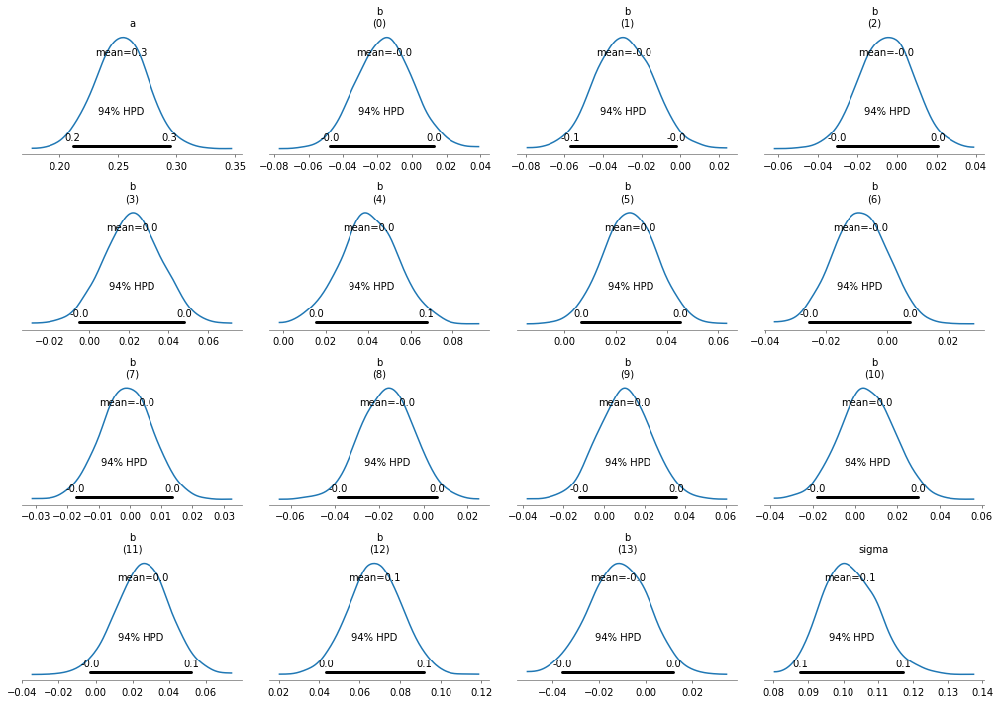

In [123]:
prior_dict = fit.extract(pars=['a','b','sigma'], permuted=False)
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data=['y'], 
                       posterior_predictive=['ypred'], 
                       log_likelihood=fit['log_lik'])
azpos = azfit.posterior[['a','b','sigma']]
az.plot_posterior(azpos, figsize=(14,10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff7f86440b8>,
      dtype=object)

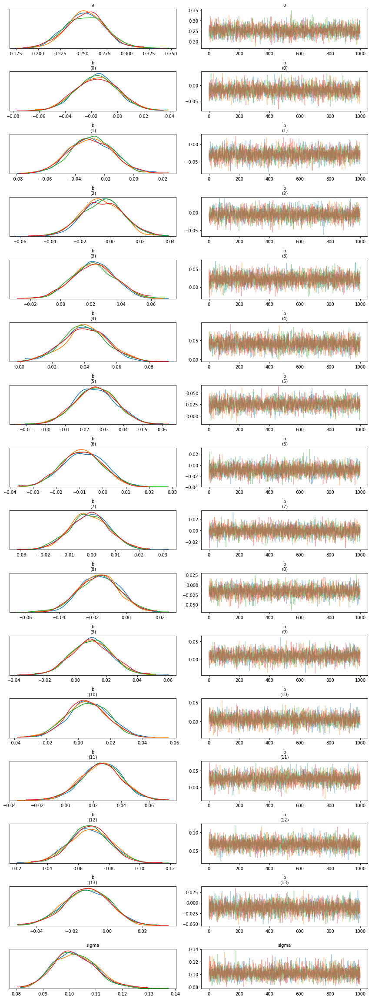

In [124]:
az.plot_trace(azpos)

Unfortunately plotting ~ 80 pairplots wasn't practical.
However we can already see that the distributions are very similar to earlier models. Let's move on to PSIS-LOO calculations: 
### __Model check__ | PSIS-LOO

In [125]:
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data='y', 
                       posterior_predictive='ypred', 
                       log_likelihood='log_lik')
az.loo(azfit)

/home/zenist/anaconda3/lib/python3.6/site-packages/mkl_fft/_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/diagnostics.py:140: RuntimeWarning: invalid value encountered in true_divide
  acorr /= acorr[0]
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:530: RuntimeWarning: overflow encountered in expm1
  x = np.expm1(-kappa * np.log1p(-probs)) / kappa
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:372: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for
        one or more samples. You should consider using a more robust model, this is because
        importance

,loo,loo_se,p_loo,warning
0,5460.410967,8279.305871,10294.529105,1


### __Predictive accuracy__ | Predict streams for 2018

/home/zenist/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


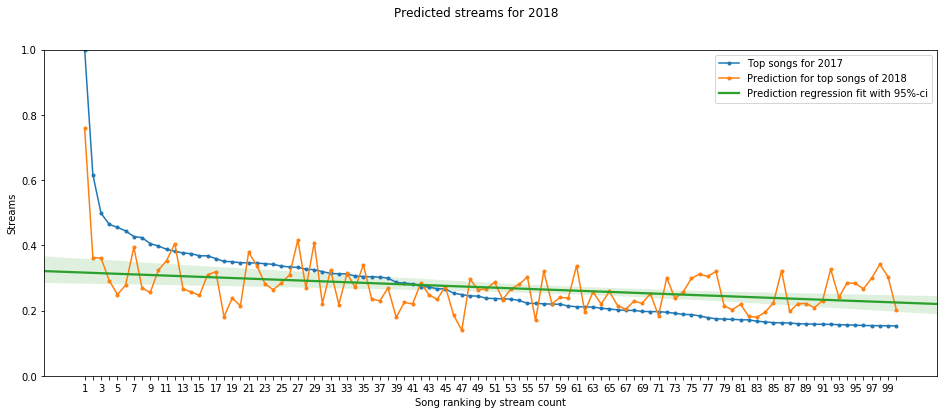

In [126]:
plt.figure(figsize=(16,6))

plt.suptitle('Predicted streams for 2018')
plt.xlabel('Song ranking by stream count')
plt.ylabel('Streams')

plt.ylim(0,1)
plt.xticks(range(1,101),labels=['{0}'.format(i) if i % 2 != 0 else '' for i in range(1,101)])
X_top100 = range(1,101)

plt.plot(X_top100, global_data['streams'], '.-', label='Top songs for 2017')
plt.plot(X_top100, np.mean(samples['ypred'], axis=0),  '.-', label='Prediction for top songs of 2018')
sns.regplot(list(X_top100), list(np.mean(samples['ypred'], axis=0)), 'o-', scatter=False, label='Prediction regression fit with 95%-ci')
plt.legend(loc='best')

In [15]:
[pystan.diagnostics.check_treedepth(fit),
 pystan.diagnostics.check_div(fit),
 pystan.diagnostics.check_energy(fit),  
]

[True, True, True]

In [16]:
[pystan.diagnostics.check_rhat(fit), pystan.diagnostics.check_n_eff(fit)]

[False, False]

## __2.6 Extended model 3__ | Adding third order polynomials
We also include third order polynomials and extend the model accordingly:

### __Load model__

In [6]:
filename = 'lin_5_informative-second_order.stan'
with open(filename) as file:
    print(file.read())

data{
    // year 2017 top 100 songs
    int N;        // number of data points
    vector[N] y;  // streams
    vector[N] X1; // acousticness
    vector[N] X2; // danceability
    vector[N] X3; // loudness
    vector[N] X4; // tempo
    vector[N] X5; // valence

    // year 2018 top 100 songs
    int Npred;        
    vector[Npred] X1pred; 
    vector[Npred] X2pred;
    vector[Npred] X3pred;
    vector[Npred] X4pred;
    vector[Npred] X5pred;
    
    // prior means 
    real mu_a;
    vector[12] mu_b;
   
    // prior stds
    real sigma_0;
}

parameters{
    real a;
    vector[12] b;
    real<lower=0> sigma;
}

transformed parameters{
    vector[N] mu;
    vector[N] X2X4;
    vector[N] X3X5;
    vector[N] X11;
    vector[N] X22;
    vector[N] X33;
    vector[N] X44;
    vector[N] X55;
    
    X11 = X1 .* X1;
    X22 = X2 .* X2;
    X33 = X3 .* X3;
    X44 = X4 .* X4;
    X55 = X5 .* X5;
    
    X2X4 = X2 .* X4;
    X3X5 = X3 .* X5;
    
    mu = a + b[1]*X1 + b[2]*X2 + b[3]*X3 + 

In [7]:
gb_2017 = global_data.values
gb_2018 = global_data.values # We need to query the API for 2018 data and pre-process it. Finnish data is used for demonstration. 
data = dict(N=gb_2017.shape[0],
            y=gb_2017[:,0],
            X1=gb_2017[:,1], X2=gb_2017[:,2], X3=gb_2017[:,4], X4=gb_2017[:,5], X5=gb_2017[:,6],
            Npred=gb_2018.shape[0], 
            X1pred=gb_2018[:,1], X2pred=gb_2018[:,2], X3pred=gb_2018[:,4], X4pred=gb_2018[:,5], X5pred=gb_2018[:,6],
            mu_a=0,
            mu_b=np.zeros(12),
            sigma_0=0.12*10)

### __Fit model__

In [8]:
# Load compiled model if available
fit = None
try:
  fit = load_model('lin_5_informative-second_order.stan.saved')
except Exception: 
  fit = pystan.stan(file=filename, data=data, seed=42)
  save_model(fit, filename + '.saved')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_2d5b7577dc304a3aff7b350232a7267c NOW.
/home/zenist/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.
  after removing the cwd from sys.path.


In [9]:
samples = fit.extract(permuted=True)

### __Simulation results__ | Posterior

In [10]:
summary = fit.summary(pars = ['a','b','sigma','ypred',]) 
fit_sum = pd.DataFrame(summary['summary'],
                  index=summary['summary_rownames'],
                  columns = summary['summary_colnames'])

fit_sum.iloc[0:14,0:10]

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
a,0.246055,0.000526,0.025956,0.194683,0.228779,0.245856,0.263383,0.297093,2431.046395,0.999593
b[1],-0.007974,0.000326,0.018080,-0.042344,-0.020491,-0.008102,0.004206,0.027263,3077.998702,0.999813
b[2],-0.003842,0.000257,0.016360,-0.036509,-0.014272,-0.003664,0.007064,0.027926,4054.485211,0.999575
b[3],0.004607,0.000274,0.015481,-0.025347,-0.005848,0.004583,0.015023,0.034250,3202.378192,1.000358
b[4],0.028662,0.000257,0.016304,-0.002577,0.017609,0.028629,0.039615,0.061294,4035.787988,0.999863
b[5],0.017707,0.000244,0.014951,-0.011574,0.007893,0.017841,0.027900,0.046446,3759.323133,0.999725
b[6],0.025595,0.000230,0.011955,0.002131,0.017786,0.025550,0.033732,0.048787,2694.340505,1.000291
b[7],-0.008585,0.000143,0.009440,-0.027524,-0.014923,-0.008538,-0.002342,0.010255,4343.875090,0.999400
b[8],-0.010509,0.000161,0.009369,-0.029019,-0.016799,-0.010497,-0.004427,0.007845,3378.419973,1.000274
b[9],-0.004578,0.000250,0.012813,-0.029170,-0.013276,-0.004608,0.003775,0.020690,2629.112161,1.000067


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fb7ec7f8f60>,
      dtype=object)

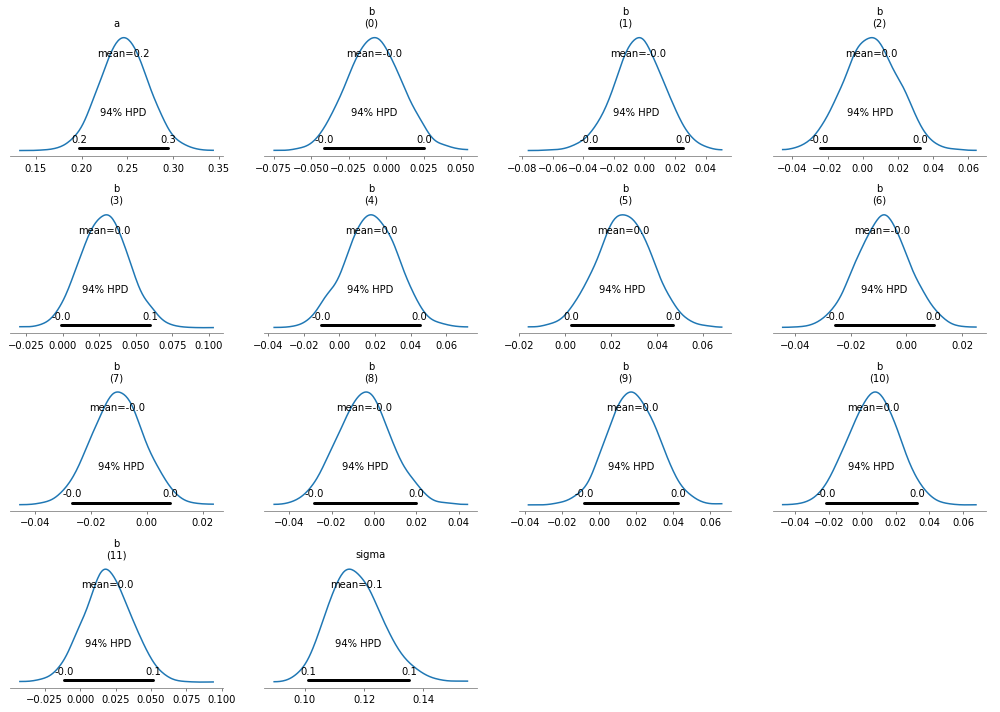

In [11]:
prior_dict = fit.extract(pars=['a','b','sigma'], permuted=False)
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data=['y'], 
                       posterior_predictive=['ypred'], 
                       log_likelihood=fit['log_lik'])
azpos = azfit.posterior[['a','b','sigma']]
az.plot_posterior(azpos, figsize=(14,10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb7ebc5c080>,
      dtype=object)

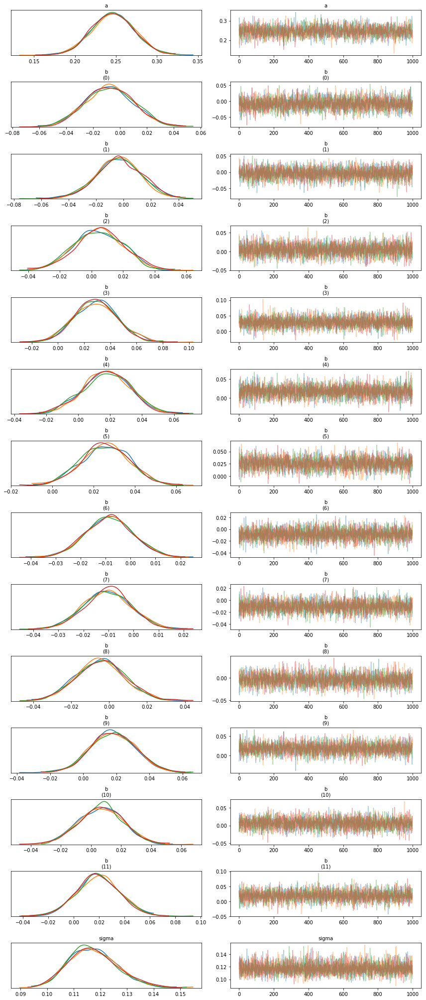

In [12]:
az.plot_trace(azpos)

Unfortunately plotting ~ 80 pairplots wasn't practical.
However we can already see that the distributions are very similar to earlier models. Let's move on to PSIS-LOO calculations: 
### __Model check__ | PSIS-LOO

In [13]:
azfit = az.from_pystan(fit=fit, prior=prior_dict, 
                       observed_data='y', 
                       posterior_predictive='ypred', 
                       log_likelihood='log_lik')
az.loo(azfit)

/home/zenist/anaconda3/lib/python3.6/site-packages/mkl_fft/_numpy_fft.py:1044: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  output = mkl_fft.rfftn_numpy(a, s, axes)
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/diagnostics.py:140: RuntimeWarning: invalid value encountered in true_divide
  acorr /= acorr[0]
/home/zenist/anaconda3/lib/python3.6/site-packages/arviz/stats/stats.py:372: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for
        one or more samples. You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal posterior and LOO posterior
        are very different. This is more likely to happen with a non-robust model and highl

,loo,loo_se,p_loo,warning
0,-775.648751,6226.299107,8654.426161,1


### __Predictive accuracy__ | Predict streams for 2018

/home/zenist/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


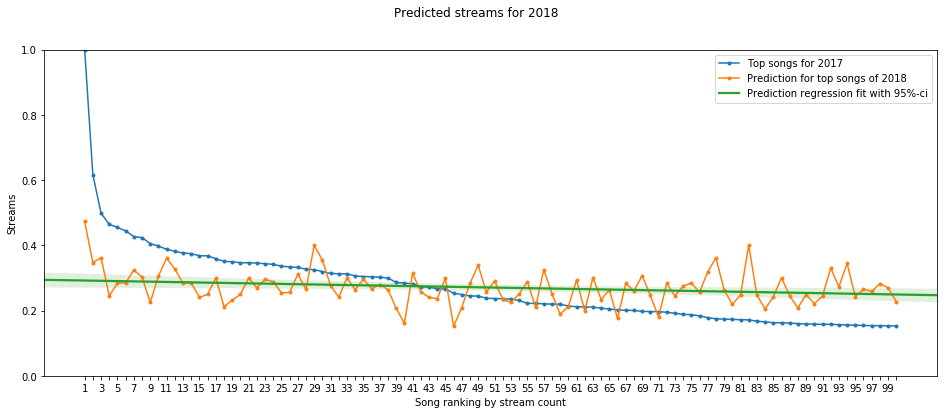

In [14]:
plt.figure(figsize=(16,6))

plt.suptitle('Predicted streams for 2018')
plt.xlabel('Song ranking by stream count')
plt.ylabel('Streams')

plt.ylim(0,1)
plt.xticks(range(1,101),labels=['{0}'.format(i) if i % 2 != 0 else '' for i in range(1,101)])
X_top100 = range(1,101)

plt.plot(X_top100, global_data['streams'], '.-', label='Top songs for 2017')
plt.plot(X_top100, np.mean(samples['ypred'], axis=0),  '.-', label='Prediction for top songs of 2018')
sns.regplot(list(X_top100), list(np.mean(samples['ypred'], axis=0)), 'o-', scatter=False, label='Prediction regression fit with 95%-ci')
plt.legend(loc='best')

In [15]:
[pystan.diagnostics.check_treedepth(fit),
 pystan.diagnostics.check_div(fit),
 pystan.diagnostics.check_energy(fit),  
]

[True, True, True]

In [16]:
[pystan.diagnostics.check_rhat(fit), pystan.diagnostics.check_n_eff(fit)]

[False, False]